# Space Titanic

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import matplotlib as mpl
import vapeplot
import mplcatppuccin
import missingno as msno

mpl.style.use('latte')
pd.options.display.max_columns=500

In [2]:
train = pd.read_csv('train.csv')
test = pd.read_csv('test.csv')

In [3]:
train.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8693 entries, 0 to 8692
Data columns (total 14 columns):
 #   Column        Non-Null Count  Dtype  
---  ------        --------------  -----  
 0   PassengerId   8693 non-null   object 
 1   HomePlanet    8492 non-null   object 
 2   CryoSleep     8476 non-null   object 
 3   Cabin         8494 non-null   object 
 4   Destination   8511 non-null   object 
 5   Age           8514 non-null   float64
 6   VIP           8490 non-null   object 
 7   RoomService   8512 non-null   float64
 8   FoodCourt     8510 non-null   float64
 9   ShoppingMall  8485 non-null   float64
 10  Spa           8510 non-null   float64
 11  VRDeck        8505 non-null   float64
 12  Name          8493 non-null   object 
 13  Transported   8693 non-null   bool   
dtypes: bool(1), float64(6), object(7)
memory usage: 891.5+ KB


In [4]:
train.isna().sum()

PassengerId       0
HomePlanet      201
CryoSleep       217
Cabin           199
Destination     182
Age             179
VIP             203
RoomService     181
FoodCourt       183
ShoppingMall    208
Spa             183
VRDeck          188
Name            200
Transported       0
dtype: int64

([0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13],
 [Text(0, 0, 'PassengerId'),
  Text(1, 0, 'HomePlanet'),
  Text(2, 0, 'CryoSleep'),
  Text(3, 0, 'Cabin'),
  Text(4, 0, 'Destination'),
  Text(5, 0, 'Age'),
  Text(6, 0, 'VIP'),
  Text(7, 0, 'RoomService'),
  Text(8, 0, 'FoodCourt'),
  Text(9, 0, 'ShoppingMall'),
  Text(10, 0, 'Spa'),
  Text(11, 0, 'VRDeck'),
  Text(12, 0, 'Name'),
  Text(13, 0, 'Transported')])

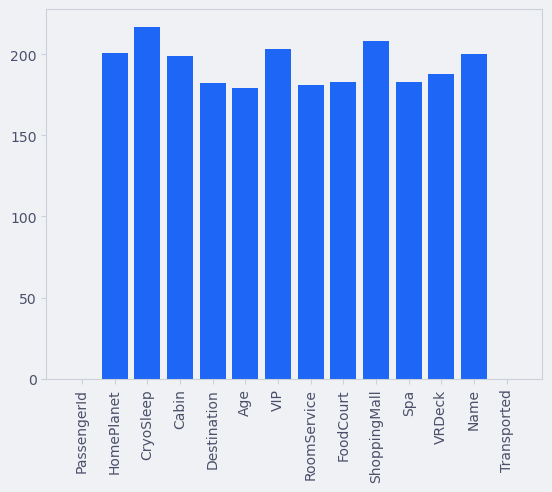

In [5]:
plt.bar(x=train.columns, height=train.isna().sum())
plt.xticks(rotation=90)

### Check missing values for train dataframe

<AxesSubplot: >

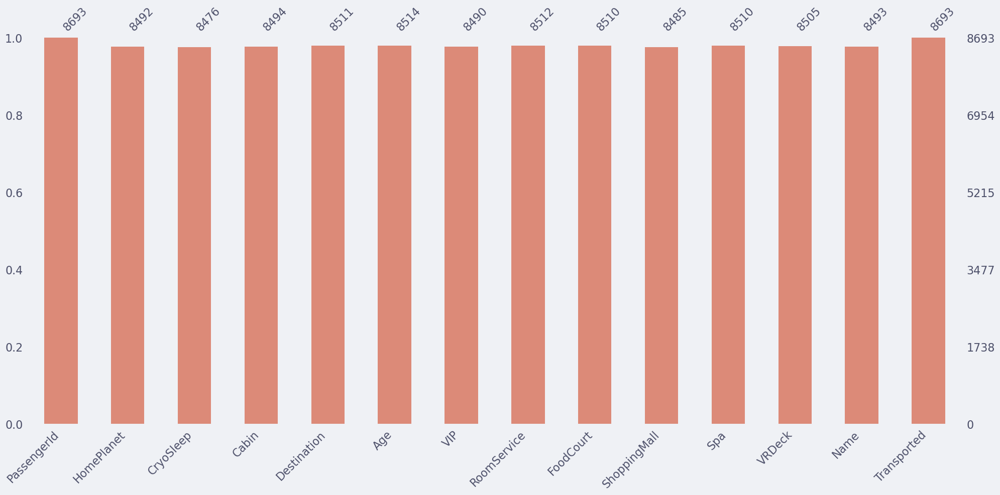

In [6]:
msno.bar(train, color='#dc8a78')

<AxesSubplot: >

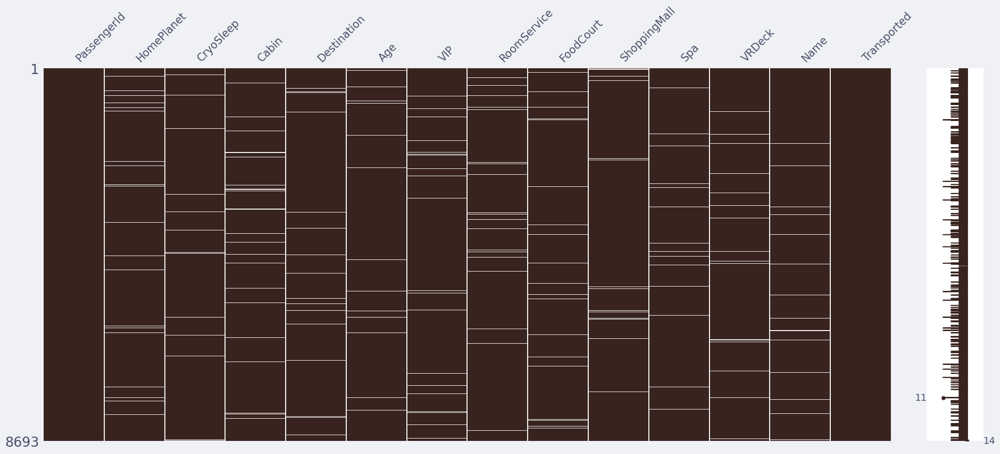

In [7]:
msno.matrix(train, color=(0.22, 0.138, 0.12))

In [8]:
train.head()

,PassengerId,HomePlanet,CryoSleep,Cabin,Destination,Age,VIP,RoomService,FoodCourt,ShoppingMall,Spa,VRDeck,Name,Transported
0,0001_01,Europa,False,B/0/P,TRAPPIST-1e,39.0,False,0.0,0.0,0.0,0.0,0.0,Maham Ofracculy,False
1,0002_01,Earth,False,F/0/S,TRAPPIST-1e,24.0,False,109.0,9.0,25.0,549.0,44.0,Juanna Vines,True
2,0003_01,Europa,False,A/0/S,TRAPPIST-1e,58.0,True,43.0,3576.0,0.0,6715.0,49.0,Altark Susent,False
3,0003_02,Europa,False,A/0/S,TRAPPIST-1e,33.0,False,0.0,1283.0,371.0,3329.0,193.0,Solam Susent,False
4,0004_01,Earth,False,F/1/S,TRAPPIST-1e,16.0,False,303.0,70.0,151.0,565.0,2.0,Willy Santantines,True


In [9]:
train.nunique()

PassengerId     8693
HomePlanet         3
CryoSleep          2
Cabin           6560
Destination        3
Age               80
VIP                2
RoomService     1273
FoodCourt       1507
ShoppingMall    1115
Spa             1327
VRDeck          1306
Name            8473
Transported        2
dtype: int64

### EDA & Check of missing values

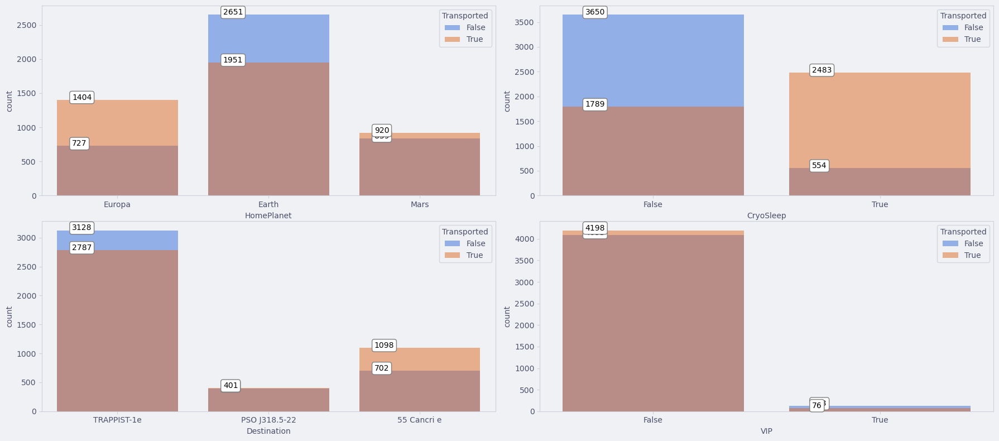

In [10]:
fig, ((axs1, axs2), (axs3, axs4)) = plt.subplots(nrows=2, ncols=2, figsize=(18,8))
sns.countplot(data=train, x='HomePlanet', hue='Transported', dodge=False, alpha=0.5, ax=axs1)
sns.countplot(data=train, x='CryoSleep', hue='Transported', dodge=False, alpha=0.5, ax=axs2)
sns.countplot(data=train, x='Destination', hue='Transported', dodge=False, alpha=0.5, ax=axs3)
sns.countplot(data=train, x='VIP', hue='Transported', dodge=False, alpha=0.5, ax=axs4)
plt.tight_layout(h_pad=0.2)

bbox = {'boxstyle':'round', 'fc':'white', 'color':'gray'}

for p in axs4.patches:
 axs4.annotate('{:.0f}'.format(p.get_height()), (p.get_x()+0.1, p.get_height()+1), color='black', bbox=bbox)

for p in axs1.patches:
 axs1.annotate('{:.0f}'.format(p.get_height()), (p.get_x()+0.1, p.get_height()+1), color='black', bbox=bbox)

for p in axs2.patches:
 axs2.annotate('{:.0f}'.format(p.get_height()), (p.get_x()+0.1, p.get_height()+1), color='black', bbox=bbox)

for p in axs3.patches:
 axs3.annotate('{:.0f}'.format(p.get_height()), (p.get_x()+0.1, p.get_height()+1), color='black', bbox=bbox) 



#### Check HomePlanet data for filling missing values

In [11]:
print('Total missing values (HomePlanet) in train dataframe: ', round(train['HomePlanet'].isna().sum() / train['HomePlanet'].count(), 3))
print('Total missing values (HomePlanet) in test dataframe: ', round(test['HomePlanet'].isna().sum() / train['HomePlanet'].count(), 3))

Total missing values (HomePlanet) in train dataframe:  0.024
Total missing values (HomePlanet) in test dataframe:  0.01


##### Not so many missing values, although some valuable information. Let's check other variables

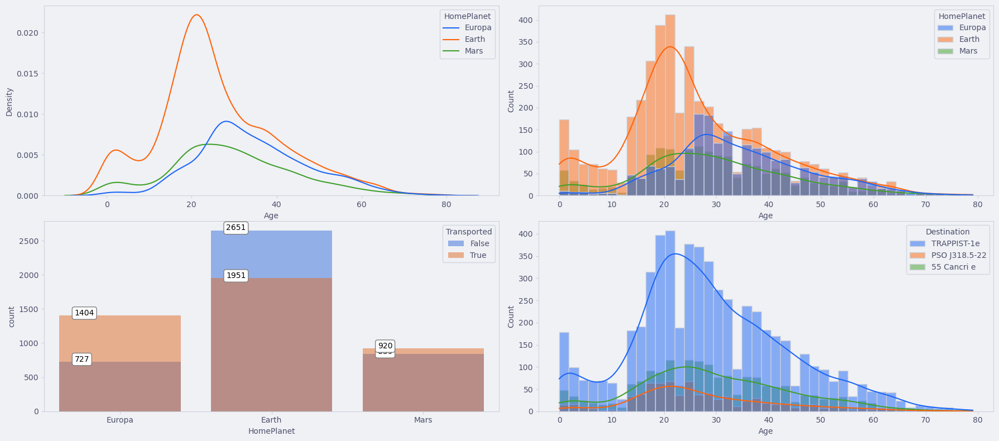

In [12]:
fig, axs = plt.subplots(nrows=2, ncols=2, figsize=(18,8))
sns.kdeplot(data=train, x='Age', hue='HomePlanet', ax=axs[0,0])
sns.histplot(data=train, x='Age', hue='HomePlanet', kde=True, ax=axs[0,1])
sns.countplot(data=train, x='HomePlanet', hue='Transported', dodge=False, alpha=0.5, ax=axs[1,0])
sns.histplot(data=train, x='Age', hue='Destination',kde=True, ax=axs[1,1])
plt.tight_layout(h_pad=0.2)


for p in axs[1,0].patches:
  axs[1,0].annotate('{:.0f}'.format(p.get_height()), (p.get_x()+0.1, p.get_height()+1), color='black', bbox=bbox)

##### From the information plotted (which includes other variables), it is safe to assume the info missing for HomePlanet is people from Earth

In [13]:
train['HomePlanet'] = train['HomePlanet'].fillna('Earth')
test['HomePlanet'] = test['HomePlanet'].fillna('Earth')

<AxesSubplot: >

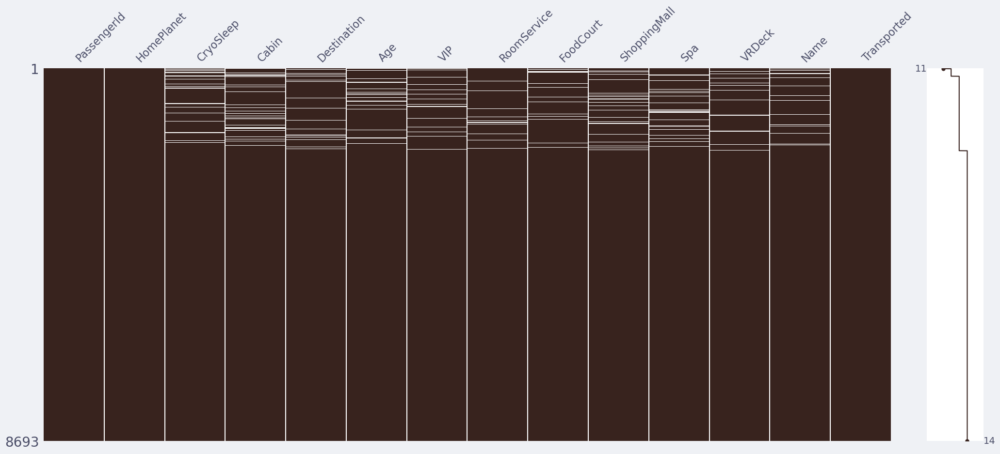

In [14]:
msno.matrix(train, filter='top', sort='ascending', color=(0.22, 0.138, 0.12))

<AxesSubplot: >

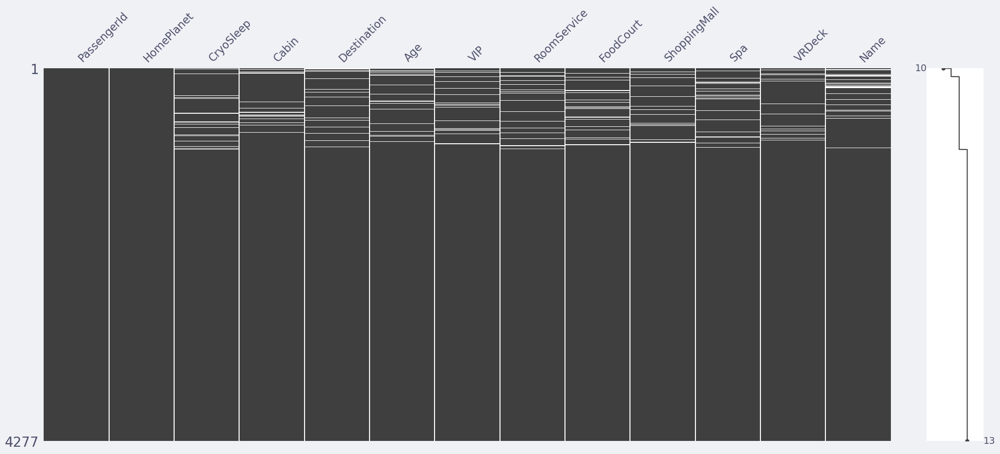

In [15]:
msno.matrix(test, filter='top', sort='ascending')

#### Check CryoSleep

##### Check total percentage of missing values

In [16]:
print('Total missing values (CryoSleep) in train dataframe: ', round(train['CryoSleep'].isna().sum() / train['CryoSleep'].count(), 3))
print('Total missing values (CryoSleep) in test dataframe: ', round(test['CryoSleep'].isna().sum() / train['CryoSleep'].count(), 3))

Total missing values (CryoSleep) in train dataframe:  0.026
Total missing values (CryoSleep) in test dataframe:  0.011


##### Check actual number of missing values

In [17]:
print('Total missing values (CryoSleep) in train dataframe: ', train['CryoSleep'].isna().sum())
print('Total missing values (CryoSleep) in test dataframe: ', test['CryoSleep'].isna().sum())

Total missing values (CryoSleep) in train dataframe:  217
Total missing values (CryoSleep) in test dataframe:  93


##### Small check of the ratio between False and True values

In [18]:
val_false = train['CryoSleep'].isna().sum()*(train['CryoSleep'].where(train['CryoSleep']==False).count()/train['CryoSleep'].count())

val_true = train['CryoSleep'].isna().sum()*(train['CryoSleep'].where(train['CryoSleep']==True).count()/train['CryoSleep'].count())

print(round(val_false,0))
print(round(val_true,0))
print(round(val_false+val_true,0))

139.0
78.0
217.0


##### Quick graphical check of the feature CryoSleep againts others

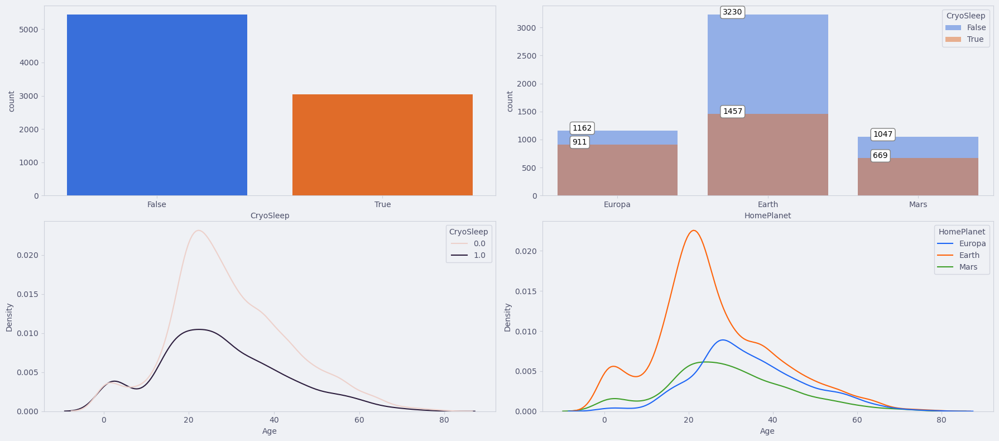

In [19]:
fig, axs = plt.subplots(nrows=2, ncols=2, figsize=(18,8))
sns.countplot(data=train, x='CryoSleep', ax=axs[0,0])
sns.countplot(data=train, x='HomePlanet', hue='CryoSleep', dodge=False, alpha=0.5, ax=axs[0,1])
sns.kdeplot(data=train, x='Age', hue='CryoSleep', ax=axs[1,0])
sns.kdeplot(data=train, x='Age', hue='HomePlanet', ax=axs[1,1])
plt.tight_layout(h_pad=0.2)

for p in axs[0,1].patches:
  axs[0,1].annotate('{:.0f}'.format(p.get_height()), (p.get_x()+0.1, p.get_height()+1), color='black', bbox=bbox)

##### Fill the values using the False and True ratios for keeping them 'balanced'

In [20]:
### Fill data
train['CryoSleep'] = train['CryoSleep'].fillna(value=False, limit=int(val_false))
train['CryoSleep'] = train['CryoSleep'].fillna(value=True, limit=(int(val_true)+1))
train['CryoSleep'].isna().sum()

0

<AxesSubplot: >

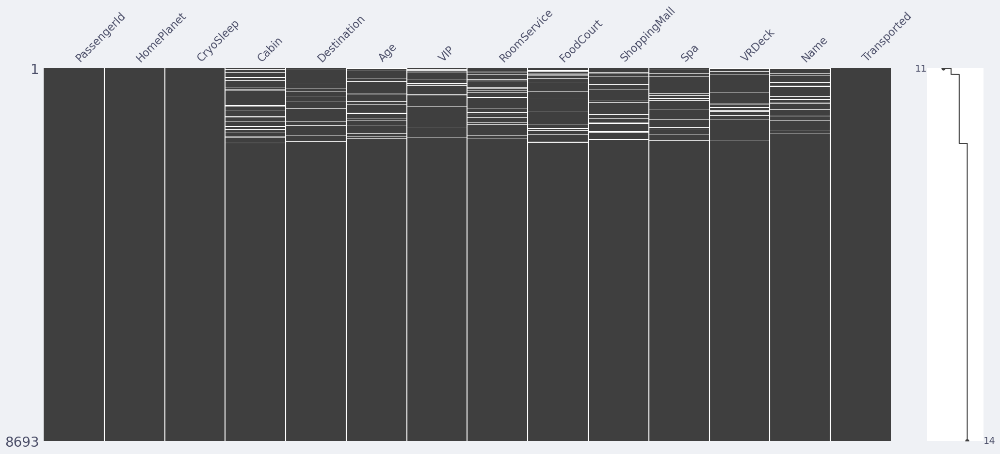

In [21]:
msno.matrix(train, filter='top', sort='ascending')

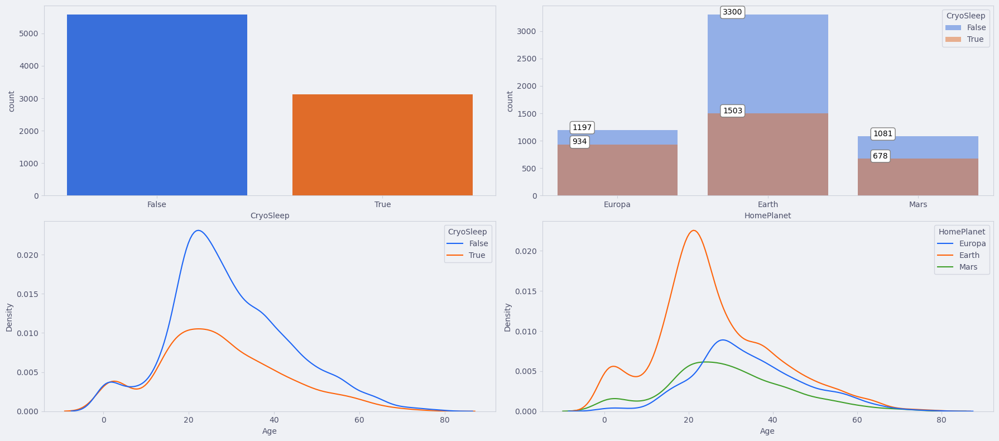

In [22]:
fig, axs = plt.subplots(nrows=2, ncols=2, figsize=(18,8))
sns.countplot(data=train, x='CryoSleep', ax=axs[0,0])
sns.countplot(data=train, x='HomePlanet', hue='CryoSleep', dodge=False, alpha=0.5, ax=axs[0,1])
sns.kdeplot(data=train, x='Age', hue='CryoSleep', ax=axs[1,0])
sns.kdeplot(data=train, x='Age', hue='HomePlanet', ax=axs[1,1])
plt.tight_layout(h_pad=0.2)

for p in axs[0,1].patches:
  axs[0,1].annotate('{:.0f}'.format(p.get_height()), (p.get_x()+0.1, p.get_height()+1), color='black', bbox=bbox)

##### Same process for the test dataframe

In [23]:
val_false = test['CryoSleep'].isna().sum()*(test['CryoSleep'].where(test['CryoSleep']==False).count()/test['CryoSleep'].count())

val_true = test['CryoSleep'].isna().sum()*(test['CryoSleep'].where(test['CryoSleep']==True).count()/test['CryoSleep'].count())

print(round(val_false,0))
print(round(val_true,0))
print(round(val_false+val_true,0))

59.0
34.0
93.0


In [24]:
test['CryoSleep'] = test['CryoSleep'].fillna(value=False, limit=int(val_false))
test['CryoSleep'] = test['CryoSleep'].fillna(value=True, limit=(int(val_true)+1))
test['CryoSleep'].isna().sum()

0

<AxesSubplot: >

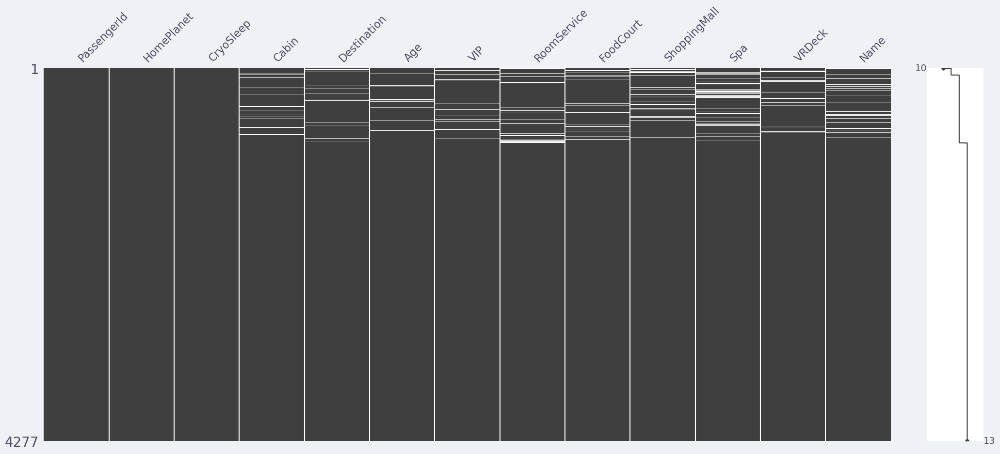

In [25]:
msno.matrix(test, filter='top', sort='ascending')

#### Check Cabin

In [26]:
print('Total missing values (Cabin) in train dataframe: ', round(train['Cabin'].isna().sum() / train['Cabin'].count(), 3))

print('Total missing values (Cabin) in test dataframe: ', round(test['Cabin'].isna().sum() / train['Cabin'].count(), 3))

Total missing values (Cabin) in train dataframe:  0.023
Total missing values (Cabin) in test dataframe:  0.012


In [27]:
print('Total missing values (Cabin) in train dataframe: ', train['Cabin'].isna().sum())
print('Total missing values (Cabin) in test dataframe: ', test['Cabin'].isna().sum())

Total missing values (Cabin) in train dataframe:  199
Total missing values (Cabin) in test dataframe:  100


In [28]:
train['Cabin'].head()

0    B/0/P
1    F/0/S
2    A/0/S
3    A/0/S
4    F/1/S
Name: Cabin, dtype: object

##### Split the Cabin string into it's three components: deck, num (or cabin num) and side

In [29]:
pattern_deck = r'(\w+)\/'
train['Deck'] = train['Cabin'].str.extract(pat=pattern_deck, expand=False)

pattern_num = r'\/(\d+)\/'
train['Num'] = train['Cabin'].str.extract(pat=pattern_num, expand=False)

pattern_side = r'\d+\/(.*)'
train['Side'] = train['Cabin'].str.extract(pat=pattern_side, expand=False)

train.head()

,PassengerId,HomePlanet,CryoSleep,Cabin,Destination,Age,VIP,RoomService,FoodCourt,ShoppingMall,Spa,VRDeck,Name,Transported,Deck,Num,Side
0,0001_01,Europa,False,B/0/P,TRAPPIST-1e,39.0,False,0.0,0.0,0.0,0.0,0.0,Maham Ofracculy,False,B,0,P
1,0002_01,Earth,False,F/0/S,TRAPPIST-1e,24.0,False,109.0,9.0,25.0,549.0,44.0,Juanna Vines,True,F,0,S
2,0003_01,Europa,False,A/0/S,TRAPPIST-1e,58.0,True,43.0,3576.0,0.0,6715.0,49.0,Altark Susent,False,A,0,S
3,0003_02,Europa,False,A/0/S,TRAPPIST-1e,33.0,False,0.0,1283.0,371.0,3329.0,193.0,Solam Susent,False,A,0,S
4,0004_01,Earth,False,F/1/S,TRAPPIST-1e,16.0,False,303.0,70.0,151.0,565.0,2.0,Willy Santantines,True,F,1,S


In [30]:
deck = train.pop('Deck')
num = train.pop('Num')
side = train.pop('Side')

train.insert(4, 'CabinDeck', deck)
train.insert(5, 'CabinNum', num)
train.insert(6, "CabinSide", side)

train.head()

,PassengerId,HomePlanet,CryoSleep,Cabin,CabinDeck,CabinNum,CabinSide,Destination,Age,VIP,RoomService,FoodCourt,ShoppingMall,Spa,VRDeck,Name,Transported
0,0001_01,Europa,False,B/0/P,B,0,P,TRAPPIST-1e,39.0,False,0.0,0.0,0.0,0.0,0.0,Maham Ofracculy,False
1,0002_01,Earth,False,F/0/S,F,0,S,TRAPPIST-1e,24.0,False,109.0,9.0,25.0,549.0,44.0,Juanna Vines,True
2,0003_01,Europa,False,A/0/S,A,0,S,TRAPPIST-1e,58.0,True,43.0,3576.0,0.0,6715.0,49.0,Altark Susent,False
3,0003_02,Europa,False,A/0/S,A,0,S,TRAPPIST-1e,33.0,False,0.0,1283.0,371.0,3329.0,193.0,Solam Susent,False
4,0004_01,Earth,False,F/1/S,F,1,S,TRAPPIST-1e,16.0,False,303.0,70.0,151.0,565.0,2.0,Willy Santantines,True


<AxesSubplot: >

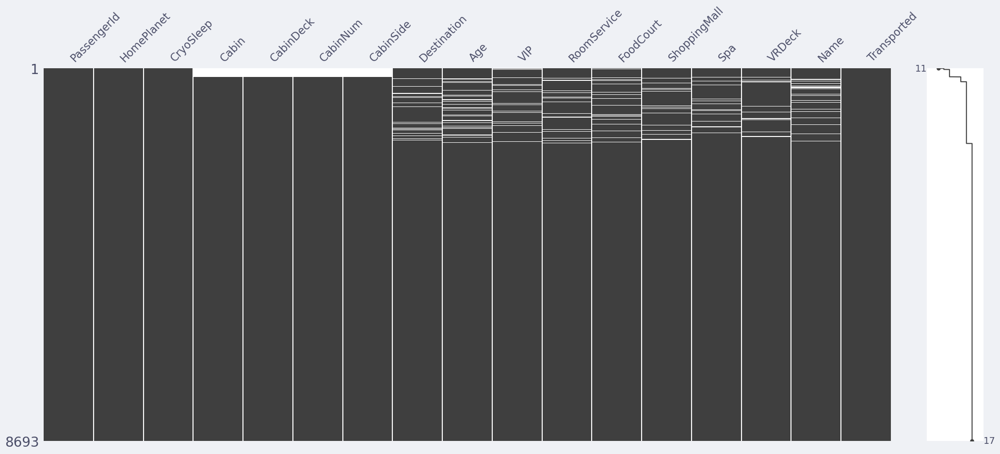

In [31]:
msno.matrix(train, filter='top', sort='ascending')

##### Do the split again for the test set

In [32]:
pattern_deck = r'(\w+)\/'
test['Deck'] = test['Cabin'].str.extract(pat=pattern_deck, expand=False)

pattern_num = r'\/(\d+)\/'
test['Num'] = test['Cabin'].str.extract(pat=pattern_num, expand=False)

pattern_side = r'\d+\/(.*)'
test['Side'] = test['Cabin'].str.extract(pat=pattern_side, expand=False)

test.head()

,PassengerId,HomePlanet,CryoSleep,Cabin,Destination,Age,VIP,RoomService,FoodCourt,ShoppingMall,Spa,VRDeck,Name,Deck,Num,Side
0,0013_01,Earth,True,G/3/S,TRAPPIST-1e,27.0,False,0.0,0.0,0.0,0.0,0.0,Nelly Carsoning,G,3,S
1,0018_01,Earth,False,F/4/S,TRAPPIST-1e,19.0,False,0.0,9.0,0.0,2823.0,0.0,Lerome Peckers,F,4,S
2,0019_01,Europa,True,C/0/S,55 Cancri e,31.0,False,0.0,0.0,0.0,0.0,0.0,Sabih Unhearfus,C,0,S
3,0021_01,Europa,False,C/1/S,TRAPPIST-1e,38.0,False,0.0,6652.0,0.0,181.0,585.0,Meratz Caltilter,C,1,S
4,0023_01,Earth,False,F/5/S,TRAPPIST-1e,20.0,False,10.0,0.0,635.0,0.0,0.0,Brence Harperez,F,5,S


<AxesSubplot: >

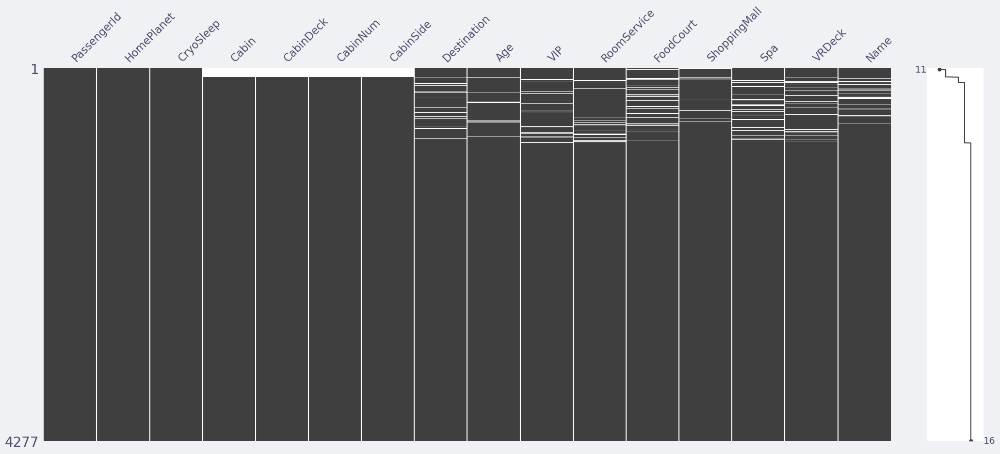

In [33]:
test_deck = test.pop('Deck')
test_num = test.pop('Num')
test_side = test.pop('Side')

test.insert(4, 'CabinDeck', test_deck)
test.insert(5, 'CabinNum', test_num)
test.insert(6, 'CabinSide', test_side)

msno.matrix(test, filter='top', sort='ascending')

In [34]:
print('Total missing values (CabinDeck) in train dataframe: ', train['CabinDeck'].isna().sum())

print('Total missing values (CabinDeck) in test dataframe: ', test['CabinDeck'].isna().sum())

Total missing values (CabinDeck) in train dataframe:  199
Total missing values (CabinDeck) in test dataframe:  100


In [35]:
print('Total missing values (CabinNum) in train dataframe: ', train['CabinNum'].isna().sum())

print('Total missing values (CabinNum) in test dataframe: ', test['CabinNum'].isna().sum())

Total missing values (CabinNum) in train dataframe:  199
Total missing values (CabinNum) in test dataframe:  100


In [36]:
print('Total missing values (CabinSide) in train dataframe: ', train['CabinSide'].isna().sum())

print('Total missing values (CabinSide) in test dataframe: ', test['CabinSide'].isna().sum())

Total missing values (CabinSide) in train dataframe:  199
Total missing values (CabinSide) in test dataframe:  100


In [37]:
train.nunique()

PassengerId     8693
HomePlanet         3
CryoSleep          2
Cabin           6560
CabinDeck          8
CabinNum        1817
CabinSide          2
Destination        3
Age               80
VIP                2
RoomService     1273
FoodCourt       1507
ShoppingMall    1115
Spa             1327
VRDeck          1306
Name            8473
Transported        2
dtype: int64

##### Check the total values available in CabinDeck and CabinSide

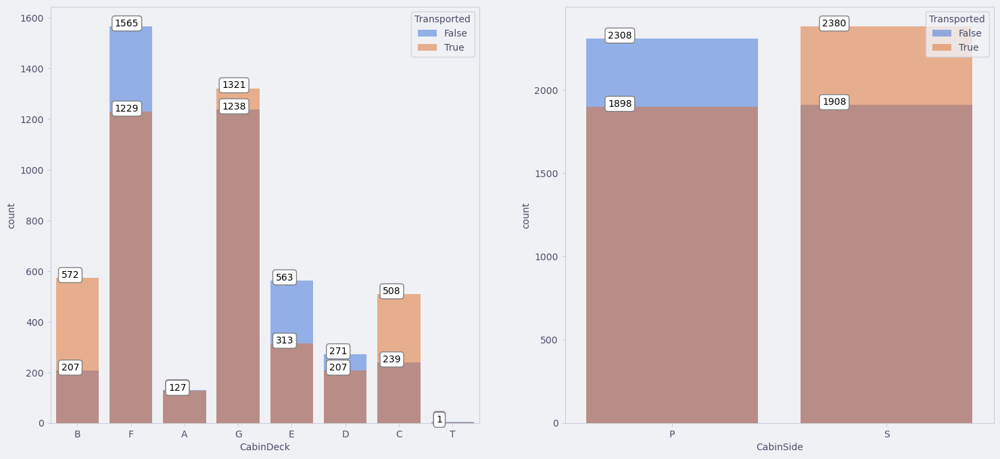

In [38]:
fig, axs = plt.subplots(nrows=1, ncols=2, figsize=(18,8))
sns.countplot(data=train, x='CabinDeck', hue='Transported', dodge=False, alpha=0.5, hue_order=[False, True], ax=axs[0])
sns.countplot(data=train, x='CabinSide', hue='Transported', dodge=False, alpha=0.5, hue_order=[False, True], ax=axs[1])

for p in axs[0].patches:
  axs[0].annotate('{:.0f}'.format(p.get_height()), (p.get_x()+0.1, p.get_height()+1), color='black', bbox=bbox)

for p in axs[1].patches:
  axs[1].annotate('{:.0f}'.format(p.get_height()), (p.get_x()+0.1, p.get_height()+1), color='black', bbox=bbox)

##### Since CabinNum has too many different values, we analyse them in a different form

In [39]:
train['CabinNum'].describe()

count     8494
unique    1817
top         82
freq        28
Name: CabinNum, dtype: object

##### Use sklearn's SimpleImputer for filling up the data in CabinNum

In [40]:
from sklearn.impute import SimpleImputer

imputer = SimpleImputer(missing_values=np.nan, strategy='most_frequent')

train['CabinNum'] = imputer.fit_transform(train[['CabinNum']]).ravel()
test['CabinNum'] = imputer.fit_transform(test[['CabinNum']]).ravel()

<AxesSubplot: >

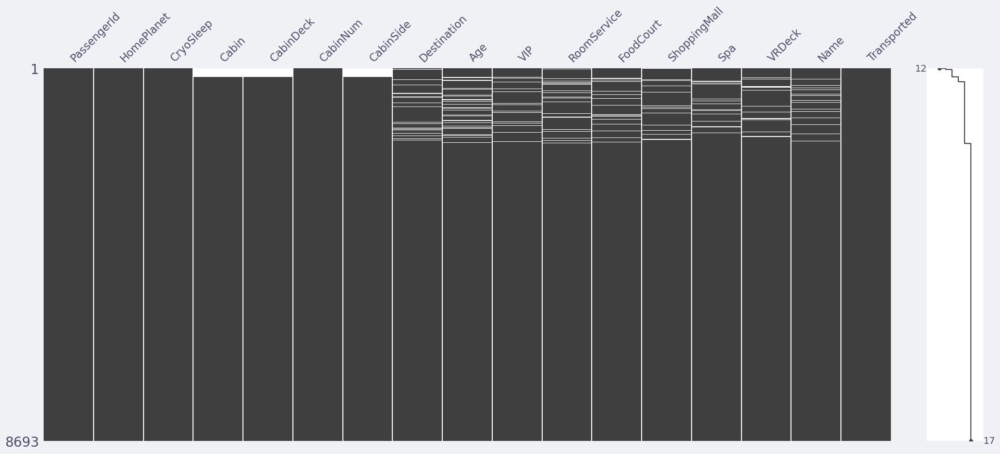

In [41]:
msno.matrix(train, filter='top', sort='ascending')

<AxesSubplot: >

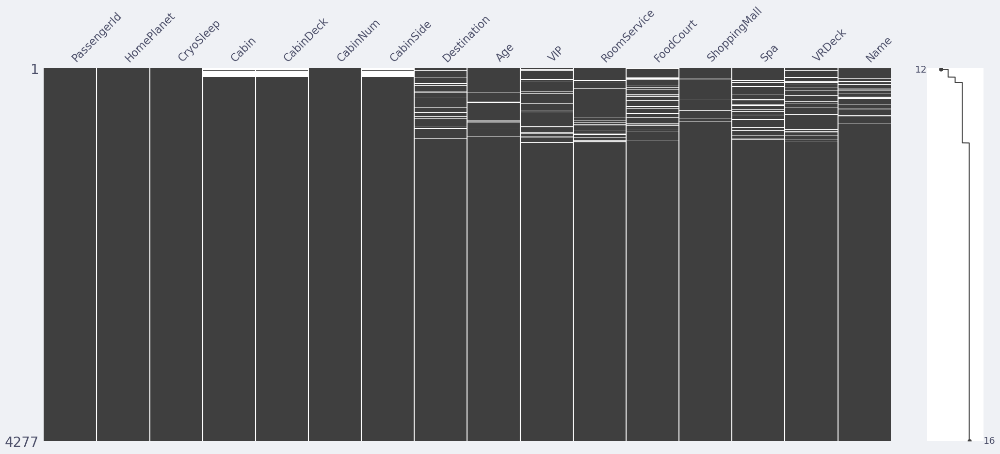

In [42]:
msno.matrix(test, filter='top', sort='ascending')

##### Convert the CabinNum feature from 'object' to int

In [43]:
train['CabinNum'] = train['CabinNum'].astype(int)

##### Check the distribution of the cabin numbers against the other two variables

<AxesSubplot: xlabel='CabinNum', ylabel='Count'>

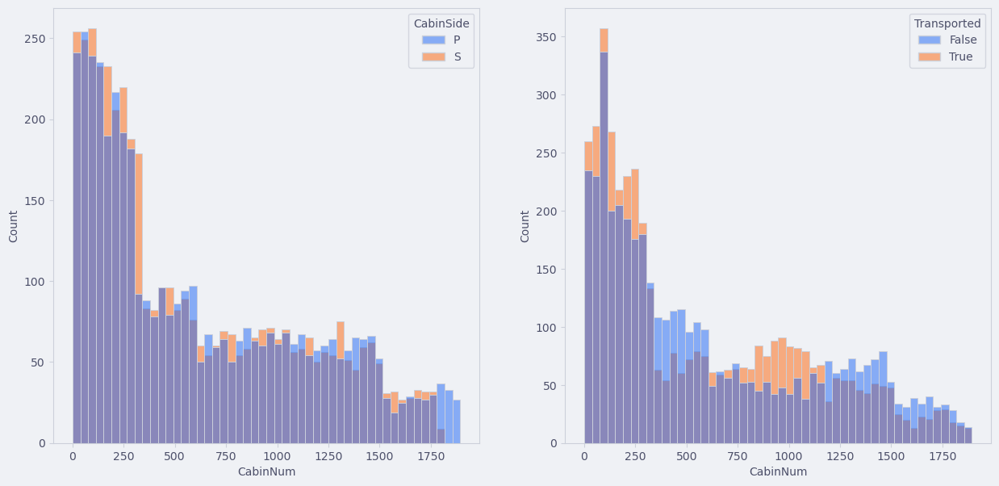

In [44]:
fig, axs = plt.subplots(nrows=1, ncols=2, figsize=(15,7))
sns.histplot(data=train, x='CabinNum', hue='CabinSide', bins=50, ax=axs[0])
sns.histplot(data=train, x='CabinNum', hue='Transported', bins=50, ax=axs[1])

##### There is not so much difference on the survival number depending on the cabin number, although it can be seen that the majority of the people are in the cabin numbers up to 250

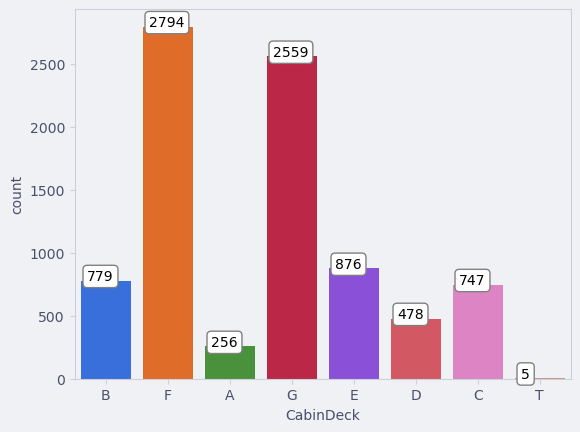

In [45]:
ax = sns.countplot(data=train, x='CabinDeck', dodge=False)

for p in ax.patches:
  ax.annotate('{:.0f}'.format(p.get_height()), (p.get_x()+0.1, p.get_height()+1), color='k', bbox=bbox)

##### It can be seen the deck with the lesser amount of people is T, therefore this might either be an error or they do belong to other deck

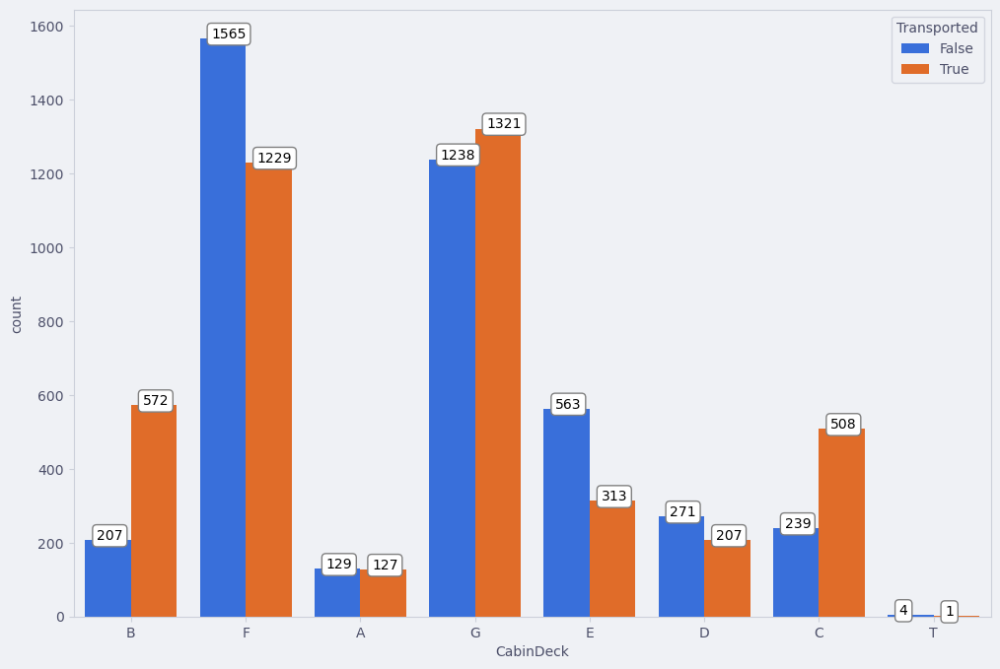

In [46]:
plt.figure(figsize=(12,8))
ax = sns.countplot(data=train, x='CabinDeck', hue='Transported', dodge=True)

for p in ax.patches:
  ax.annotate('{:.0f}'.format(p.get_height()), (p.get_x()+0.1, p.get_height()+1), color='black', bbox=bbox)

##### When checking the transported' value plotted with the deck, can be seen that all the passengers in both A, B, G and T decks were transported, hence we can change the T deck to A

In [47]:
train['CabinDeck'].loc[train['CabinDeck']=='T'] = 'A'


/var/folders/__/58jr0ft96x74h5n7dl_4rp0h0000gn/T/ipykernel_5813/47054686.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  train['CabinDeck'].loc[train['CabinDeck']=='T'] = 'A'


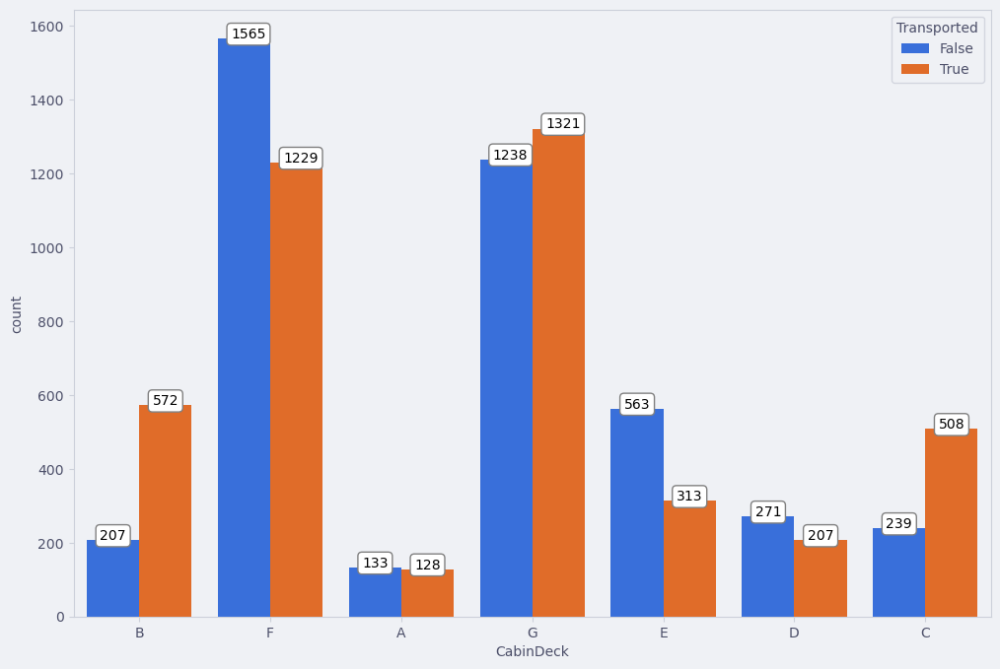

In [48]:
plt.figure(figsize=(12,8))
ax = sns.countplot(data=train, x='CabinDeck', hue='Transported')

for p in ax.patches:
  ax.annotate('{:.0f}'.format(p.get_height()), (p.get_x()+0.1, p.get_height()+1), color='black', bbox=bbox)

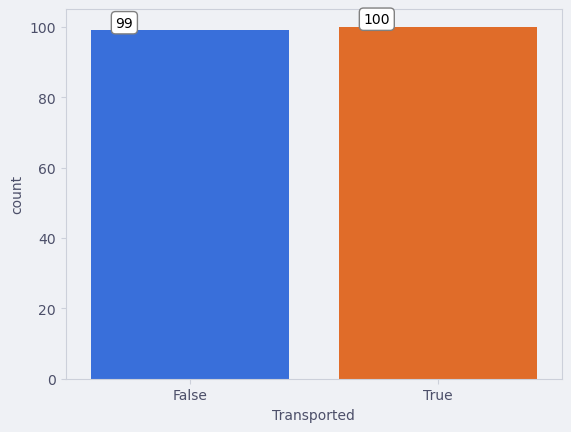

In [49]:
get_missings = train.loc[train['CabinDeck'].isna()]
ax = sns.countplot(data=get_missings, x='Transported')
for p in ax.patches:
  ax.annotate('{:.0f}'.format(p.get_height()), (p.get_x()+0.1, p.get_height()+1), color='black', bbox=bbox)

##### Based in the comparative of missing values between True and False, we assume the missing decks are 'A' since this decks have almost the same comparison between transported and not transported people

In [50]:
train['CabinDeck'] = train['CabinDeck'].fillna('A')
test['CabinDeck'] = train['CabinDeck'].fillna('A')

<AxesSubplot: >

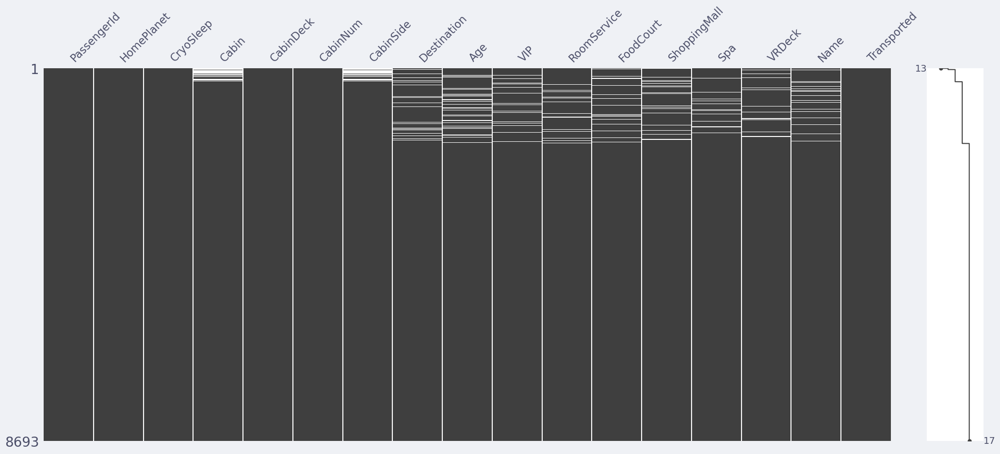

In [51]:
msno.matrix(train, filter='top', sort='ascending')

<AxesSubplot: >

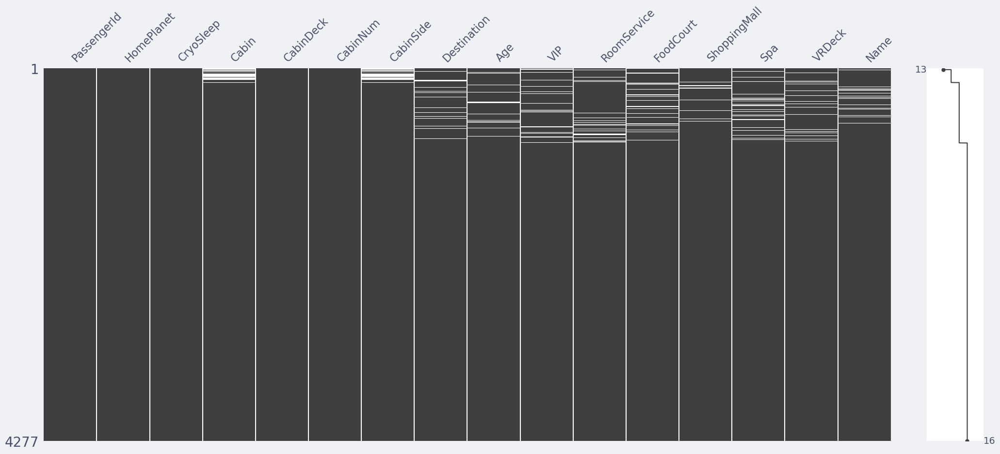

In [52]:
msno.matrix(test, filter='top', sort='ascending')

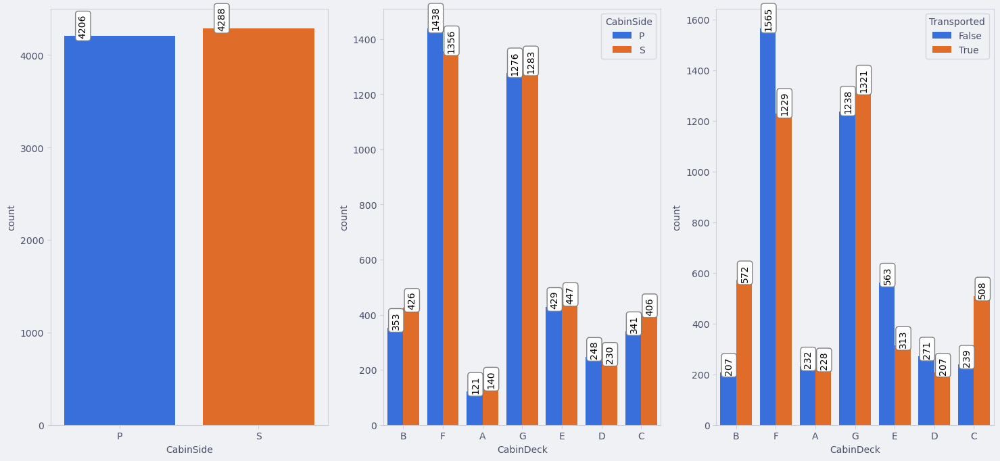

In [53]:
fig, axs = plt.subplots(nrows=1, ncols=3, figsize=(18,8))
sns.countplot(data=train, x='CabinSide', ax=axs[0])
sns.countplot(data=train, x='CabinDeck', hue='CabinSide', ax=axs[1])
sns.countplot(data=train, x='CabinDeck', hue='Transported', ax=axs[2])

for i in range(3):
  for p in axs[i].patches:
    axs[i].annotate(
      '{:.0f}'.format(p.get_height()),
      (p.get_x()+0.1, p.get_height()+1), 
      color='black',
      bbox=bbox,
      rotation=90
      )


In [54]:
val_false = train['CabinSide'].isna().sum()*(train['CabinSide'].where(train['CabinSide']=='P').count()/train['CabinSide'].count())

val_true = train['CabinSide'].isna().sum()*(train['CabinSide'].where(train['CabinSide']=='S').count()/train['CabinSide'].count())

print('Value P in CabinSide', np.floor(val_false))
print('Value S in CabinSide', np.floor(val_true))

Value P in CabinSide 98.0
Value S in CabinSide 100.0


In [55]:
train['CabinSide'] = train['CabinSide'].fillna('P', limit=int(val_false))
train['CabinSide'] = train['CabinSide'].fillna('S', limit=(int(val_true)+1))

<AxesSubplot: >

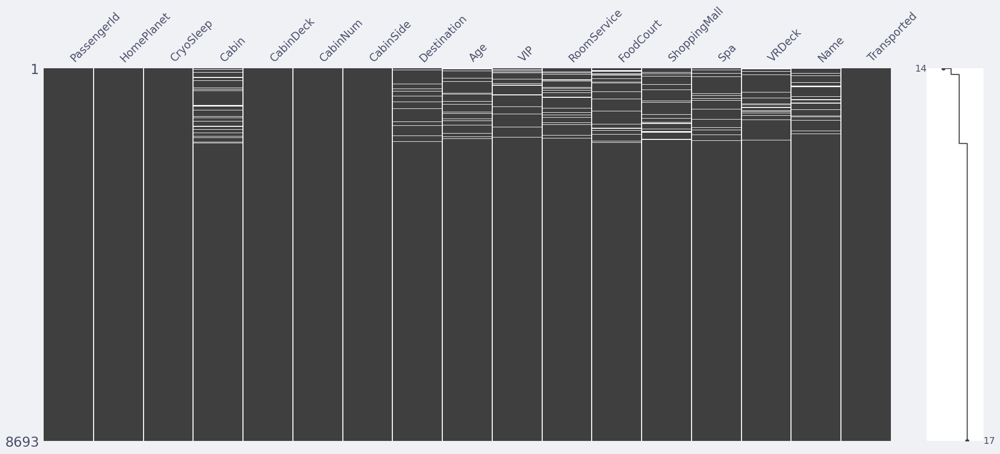

In [56]:
msno.matrix(train, filter='top', sort='ascending')

In [57]:
val_false = test['CabinSide'].isna().sum()*(test['CabinSide'].where(test['CabinSide']=='P').count()/test['CabinSide'].count())

val_true = test['CabinSide'].isna().sum()*(test['CabinSide'].where(test['CabinSide']=='S').count()/test['CabinSide'].count())

print('Value P in CabinSide', np.floor(val_false))
print('Value S in CabinSide', np.floor(val_true))

Value P in CabinSide 49.0
Value S in CabinSide 50.0


In [58]:
test['CabinSide'] = test['CabinSide'].fillna('P', limit=int(val_false))
test['CabinSide'] = test['CabinSide'].fillna('S', limit=(int(val_true)+1))

<AxesSubplot: >

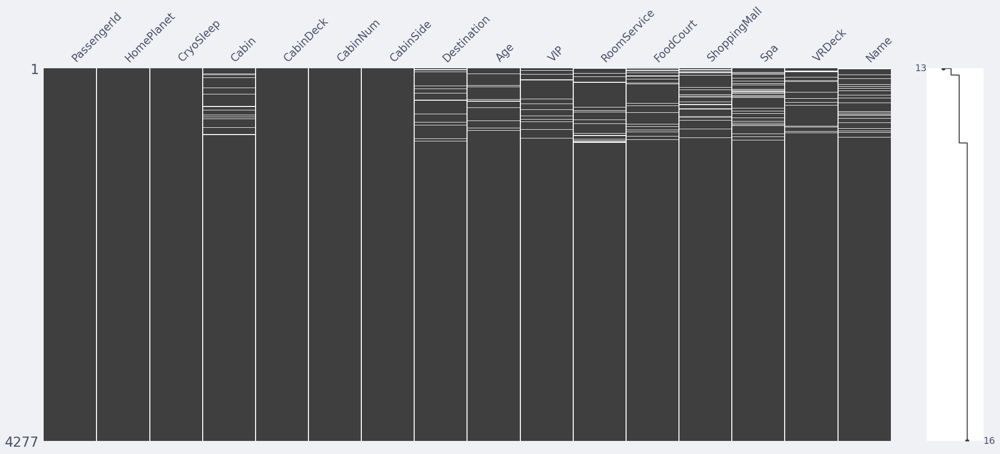

In [59]:
msno.matrix(test, filter='top', sort='ascending')

In [60]:
train = train.drop('Cabin', axis=1)
test = test.drop('Cabin', axis=1)

<AxesSubplot: >

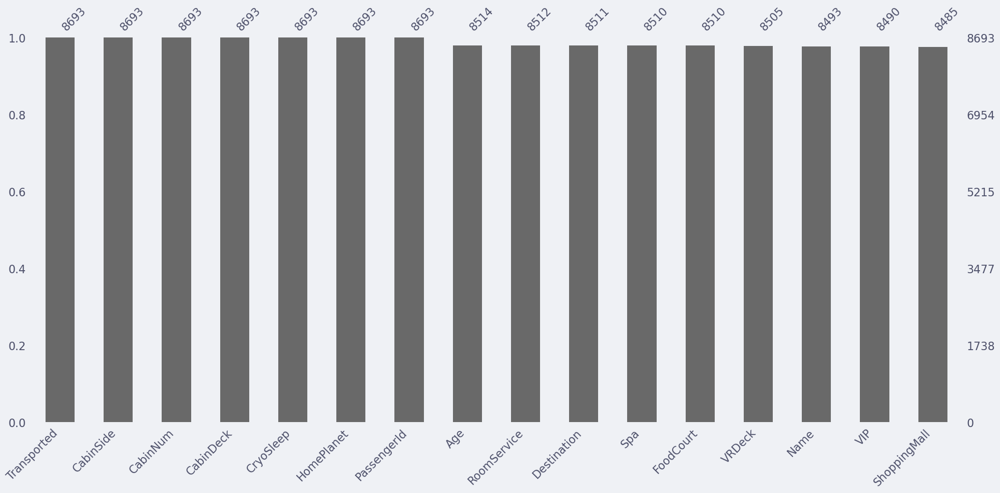

In [61]:
msno.bar(train, filter='top', sort='descending')

<AxesSubplot: >

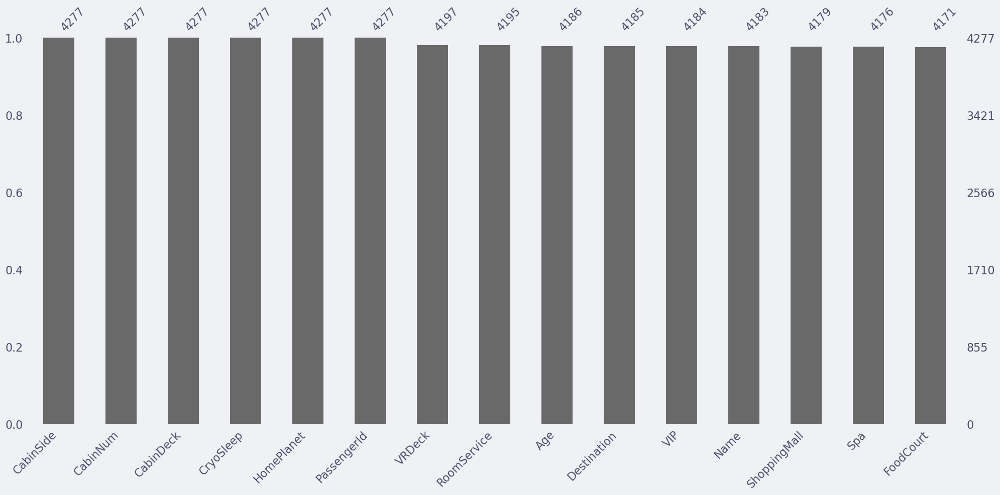

In [62]:
msno.bar(test, filter='top', sort='descending')

#### Check Age

##### Plot the age's distribution against some other features

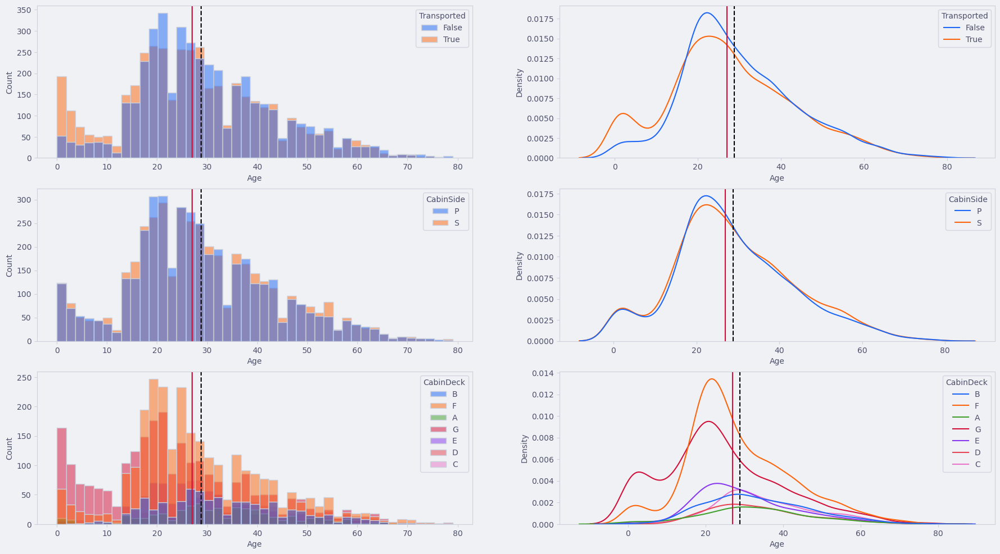

In [63]:
nrows = 3
ncols = 2

fig, axs = plt.subplots(nrows=nrows, ncols=ncols, figsize=(22,12))
sns.histplot(data=train, x='Age', hue='Transported', ax=axs[0,0])
sns.kdeplot(data=train, x='Age', hue='Transported', ax=axs[0,1])
sns.histplot(data=train, x='Age', hue='CabinSide', ax=axs[1,0])
sns.kdeplot(data=train, x='Age', hue='CabinSide', ax=axs[1,1])
sns.histplot(data=train, x='Age', hue='CabinDeck', ax=axs[2,0])
sns.kdeplot(data=train, x='Age', hue='CabinDeck', ax=axs[2,1])

for i in range(nrows): ### Plot the vline for the mean values in each graph
  for j in range(ncols):
    axs[i,j].axvline(x=train['Age'].mean(), ymin=0, color='k', ls='--', lw=1.5, label='Mean')


for i in range(nrows): ### Plot the vline for the median value in each graph
  for j in range(ncols):
    axs[i,j].axvline(x=train['Age'].median(), ymin=0, color='#D20F39', label='Median')

##### Create a new df based on the closest value to the most dense areas. In this case, the median of the age

In [64]:
ages_df = train.where(train['Age']<=train['Age'].median())

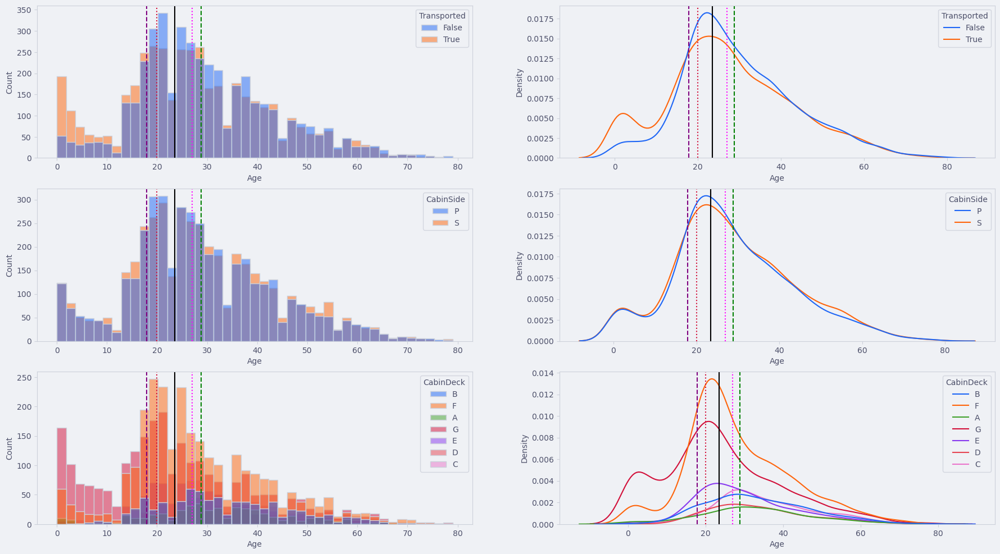

In [65]:
nrows = 3
ncols = 2

fig, axs = plt.subplots(nrows=nrows, ncols=ncols, figsize=(22,12))
sns.histplot(data=train, x='Age', hue='Transported', ax=axs[0,0])
sns.kdeplot(data=train, x='Age', hue='Transported', ax=axs[0,1])
sns.histplot(data=train, x='Age', hue='CabinSide', ax=axs[1,0])
sns.kdeplot(data=train, x='Age', hue='CabinSide', ax=axs[1,1])
sns.histplot(data=train, x='Age', hue='CabinDeck', ax=axs[2,0])
sns.kdeplot(data=train, x='Age', hue='CabinDeck', ax=axs[2,1])

for i in range(nrows):
  for j in range(ncols):
    axs[i,j].axvline(x=ages_df['Age'].mean(), ymin=0, color='purple', ls='--', lw=1.5, label='Mean')
    axs[i,j].axvline(x=train['Age'].mean(), ymin=0, color='green', ls='--', lw='1.5')
    axs[i,j].axvline(x=ages_df['Age'].median(), ymin=0, color='#D20F39', ls=':', label='Median')
    axs[i,j].axvline(x=train['Age'].median(), ymin=0, color='magenta', ls=':')
    axs[i,j].axvline(x=((train['Age'].median()+ages_df['Age'].median())/2), ymin=0, color='black', lw=1.5)


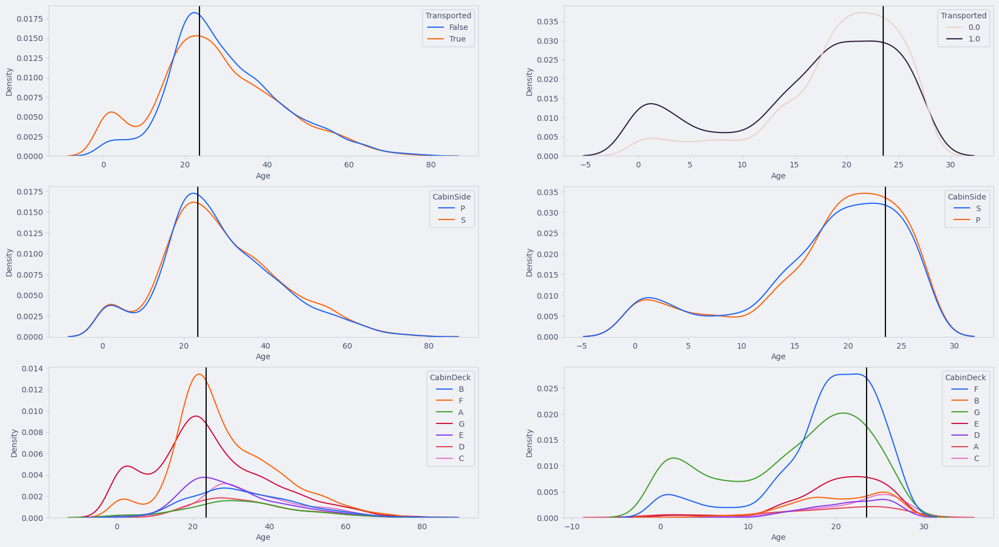

In [66]:
nrows = 3
ncols = 2

fig, axs = plt.subplots(nrows=nrows, ncols=ncols, figsize=(22,12))
sns.kdeplot(data=train, x='Age', hue='Transported', ax=axs[0,0])
sns.kdeplot(data=ages_df, x='Age', hue='Transported', ax=axs[0,1])
sns.kdeplot(data=train, x='Age', hue='CabinSide', ax=axs[1,0])
sns.kdeplot(data=ages_df, x='Age', hue='CabinSide', ax=axs[1,1])
sns.kdeplot(data=train, x='Age', hue='CabinDeck', ax=axs[2,0])
sns.kdeplot(data=ages_df, x='Age', hue='CabinDeck', ax=axs[2,1])

for i in range(nrows):
  for j in range(ncols):
    axs[i,j].axvline(x=((train['Age'].median()+ages_df['Age'].median())/2), ymin=0, color='black', lw=1.5)

In [67]:
calc_train = np.floor((train['Age'].median()+ages_df['Age'].median())/2)
calc_test = np.floor((test['Age'].median()+ages_df['Age'].median())/2)

print(calc_train)
print(calc_test)

23.0
23.0


In [68]:
train['Age'] = train['Age'].fillna(calc_train)
test['Age'] = test['Age'].fillna(calc_test)

Text(10, 300, 'Median')

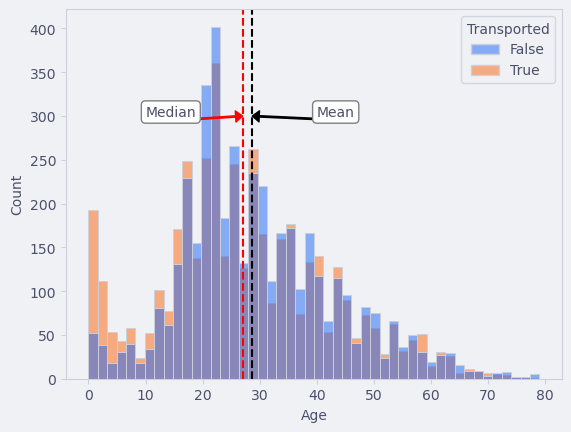

In [69]:
sns.histplot(data=train, x='Age', hue='Transported')
plt.axvline(x=train['Age'].mean(), ymin=0, color='k', ls='--')
plt.axvline(x=train['Age'].median(), ymin=0, color='red', ls='--')
plt.annotate(text='Mean', xy=(train['Age'].mean(),300), xytext=(40,300), bbox=bbox, arrowprops=dict(color='black', width=1, headwidth=8, headlength=5))
plt.annotate(text='Median', xy=(train['Age'].median(),300), xytext=(10,300), bbox=bbox, arrowprops=dict(color='red', width=1, headwidth=8, headlength=5))

<AxesSubplot: >

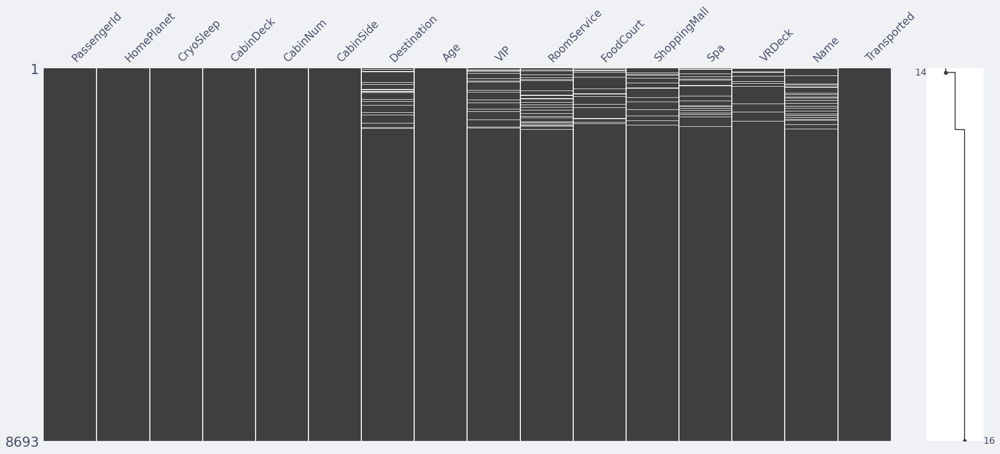

In [70]:
msno.matrix(train, filter='top', sort='ascending')

<AxesSubplot: >

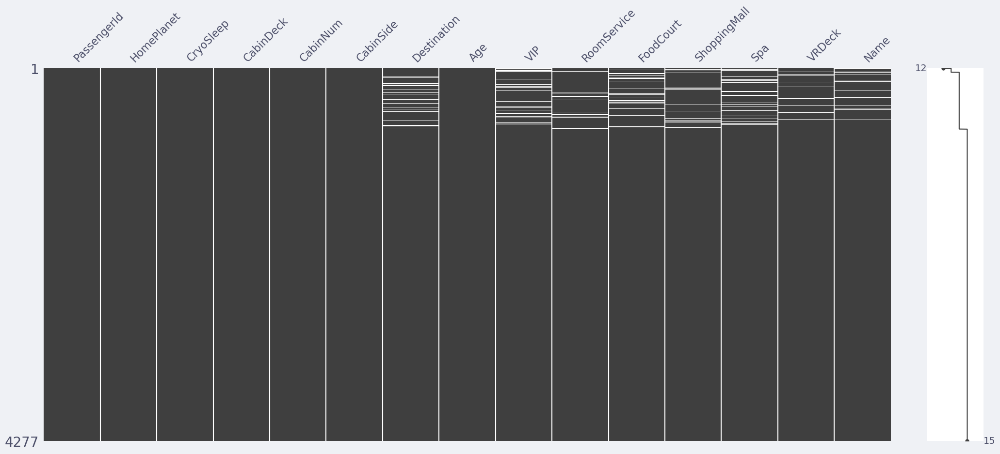

In [71]:
msno.matrix(test, filter='top', sort='ascending')

#### Check Destination

In [72]:
print('Total missing values (Destination) in train dataframe: ', train['Destination'].isna().sum())

print('Total missing values (Destination) in test dataframe: ', test['Destination'].isna().sum())

Total missing values (Destination) in train dataframe:  182
Total missing values (Destination) in test dataframe:  92


<AxesSubplot: xlabel='Destination', ylabel='count'>

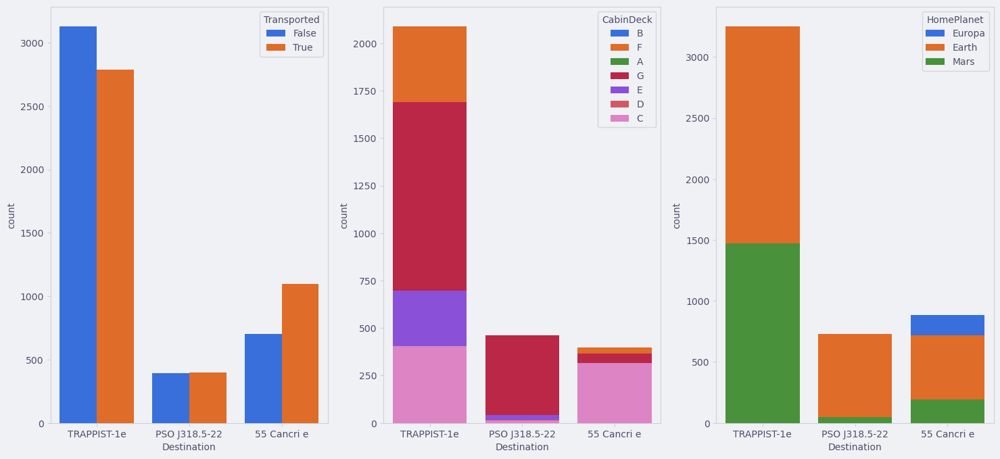

In [73]:
ncols=3
fig, axs = plt.subplots(nrows=1, ncols=ncols, figsize=(18,8))
sns.countplot(data=train, x='Destination', hue='Transported', ax=axs[0])
sns.countplot(data=train, x='Destination', hue='CabinDeck', dodge=False, ax=axs[1])
sns.countplot(data=train, x='Destination', hue='HomePlanet', dodge=False, ax=axs[2])


In [74]:
train['Destination'] = train['Destination'].fillna('TRAPPIST-1e')
test['Destination'] = test['Destination'].fillna('TRAPPIST-1e')

<AxesSubplot: xlabel='Destination', ylabel='count'>

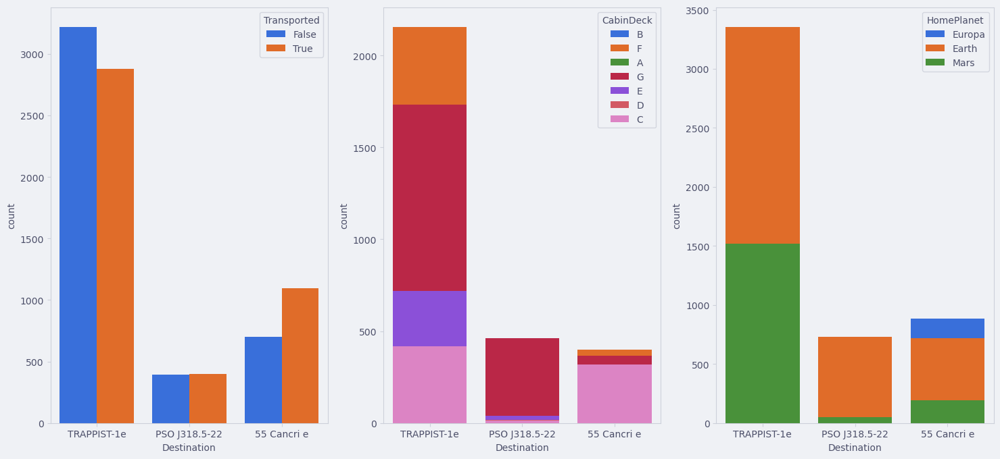

In [75]:
ncols=3
fig, axs = plt.subplots(nrows=1, ncols=ncols, figsize=(18,8))
sns.countplot(data=train, x='Destination', hue='Transported', ax=axs[0])
sns.countplot(data=train, x='Destination', hue='CabinDeck', dodge=False, ax=axs[1])
sns.countplot(data=train, x='Destination', hue='HomePlanet', dodge=False, ax=axs[2])

<AxesSubplot: >

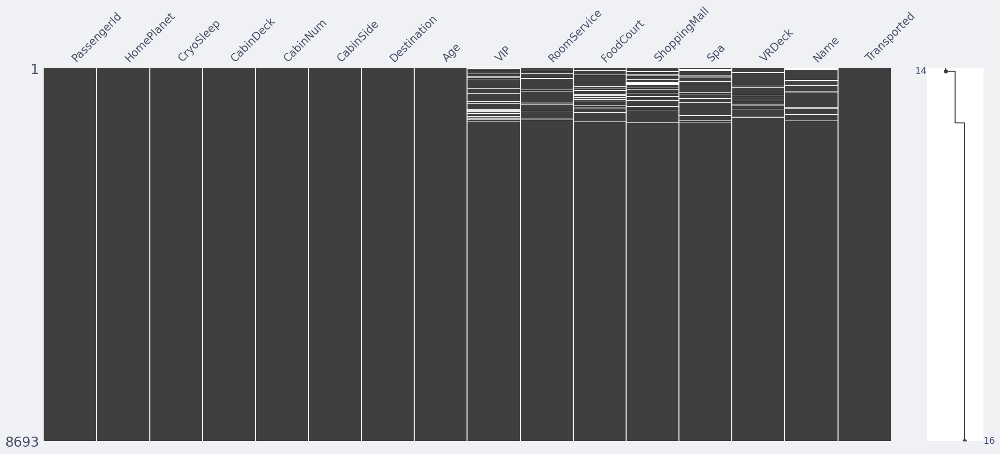

In [76]:
msno.matrix(train, filter='top', sort='ascending')

<AxesSubplot: >

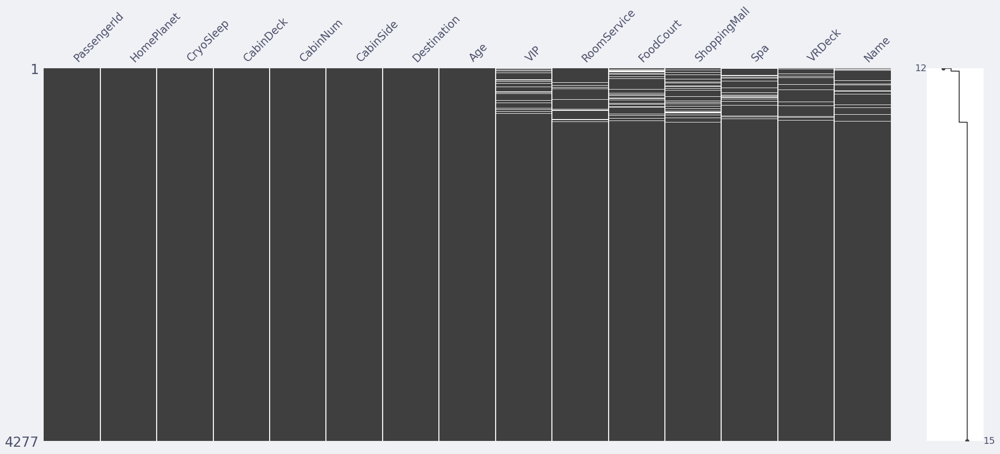

In [77]:
msno.matrix(test, filter='top', sort='ascending')

#### Check VIP

In [78]:
print('Total missing values (VIP) in train dataframe: ', train['VIP'].isna().sum())

print('Total missing values (VIP) in test dataframe: ', test['VIP'].isna().sum())

Total missing values (VIP) in train dataframe:  203
Total missing values (VIP) in test dataframe:  93


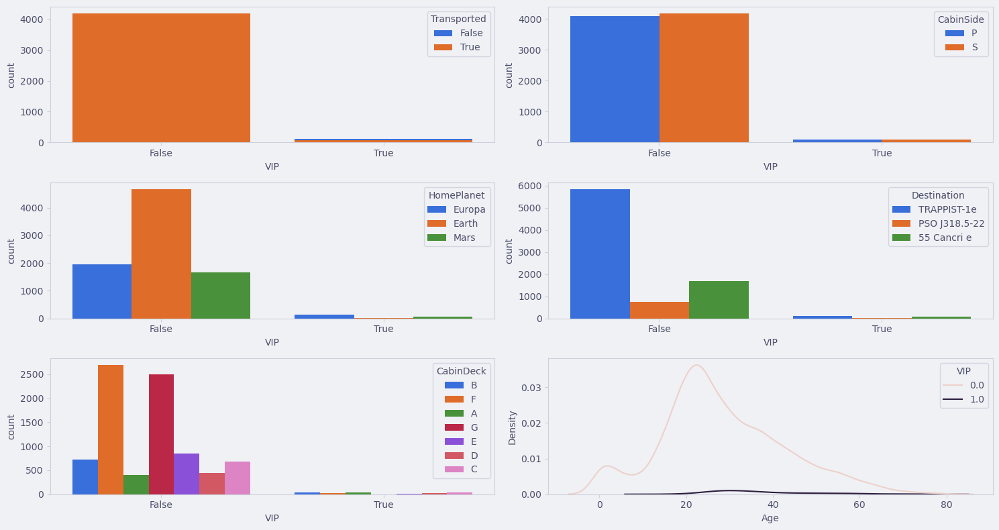

In [79]:
nrows=3
ncols=2
fig, axs = plt.subplots(nrows=nrows, ncols=ncols, figsize=(15,8))
sns.countplot(data=train, x='VIP', hue='Transported', dodge=False, ax=axs[0,0])
sns.countplot(data=train, x='VIP', hue='CabinSide', ax=axs[0,1])
sns.countplot(data=train, x='VIP', hue='HomePlanet', ax=axs[1,0])
sns.countplot(data=train, x='VIP', hue='Destination', ax=axs[1,1])
sns.countplot(data=train, x='VIP', hue='CabinDeck', ax=axs[2,0])
sns.kdeplot(data=train, x='Age', hue='VIP', ax=axs[2,1])
plt.tight_layout()

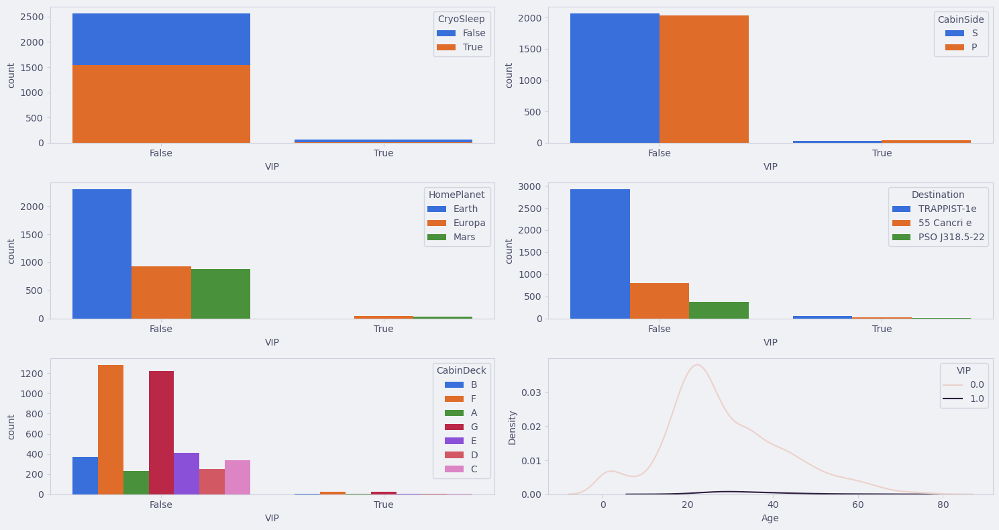

In [80]:
nrows=3
ncols=2
fig, axs = plt.subplots(nrows=nrows, ncols=ncols, figsize=(15,8))
sns.countplot(data=test, x='VIP', hue='CryoSleep', dodge=False, ax=axs[0,0])
sns.countplot(data=test, x='VIP', hue='CabinSide', ax=axs[0,1])
sns.countplot(data=test, x='VIP', hue='HomePlanet', ax=axs[1,0])
sns.countplot(data=test, x='VIP', hue='Destination', ax=axs[1,1])
sns.countplot(data=test, x='VIP', hue='CabinDeck', ax=axs[2,0])
sns.kdeplot(data=test, x='Age', hue='VIP', ax=axs[2,1])
plt.tight_layout()

In [81]:
val_false = train['VIP'].isna().sum()*(train['VIP'].where(train['VIP']==False).count()/train['VIP'].count())

val_true = train['VIP'].isna().sum()*(train['VIP'].where(train['VIP']==True).count()/train['VIP'].count())

print('Value False in VIP', np.floor(val_false))
print('Value True in VIP', np.floor(val_true))

Value False in VIP 198.0
Value True in VIP 4.0


In [82]:
train['VIP'] = train['VIP'].fillna(False, limit=int(val_false))
train['VIP'] = train['VIP'].fillna(True, limit=(int(val_true)+1))

train['VIP'].isna().sum()

0

In [83]:
val_false = test['VIP'].isna().sum()*(test['VIP'].where(train['VIP']==False).count()/test['VIP'].count())

val_true = test['VIP'].isna().sum()*(test['VIP'].where(test['VIP']==True).count()/test['VIP'].count())

print('Value False in VIP', np.floor(val_false))
print('Value True in VIP', np.floor(val_true))

Value False in VIP 91.0
Value True in VIP 1.0


In [84]:
test['VIP'] = test['VIP'].fillna(False, limit=int(val_false))
test['VIP'] = test['VIP'].fillna(True, limit=(int(val_true)+1))

test['VIP'].isna().sum()

0

<AxesSubplot: >

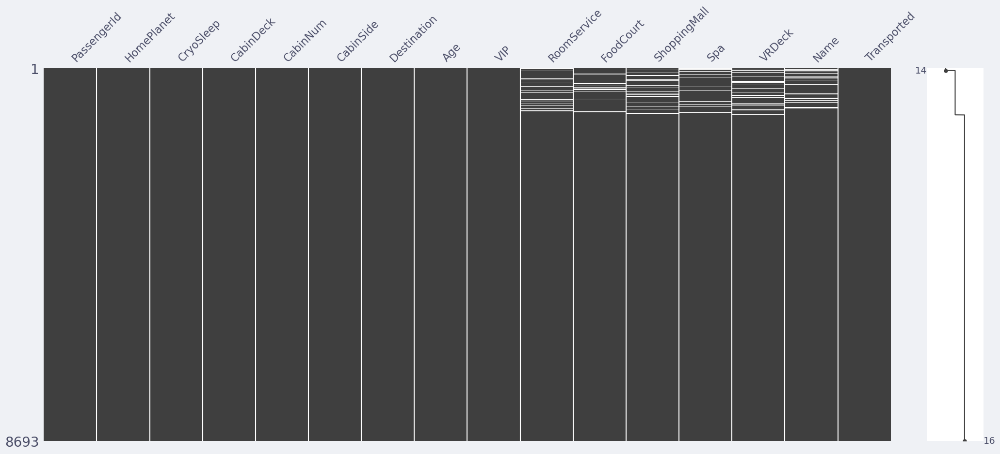

In [85]:
msno.matrix(train, filter='top', sort='ascending')

<AxesSubplot: >

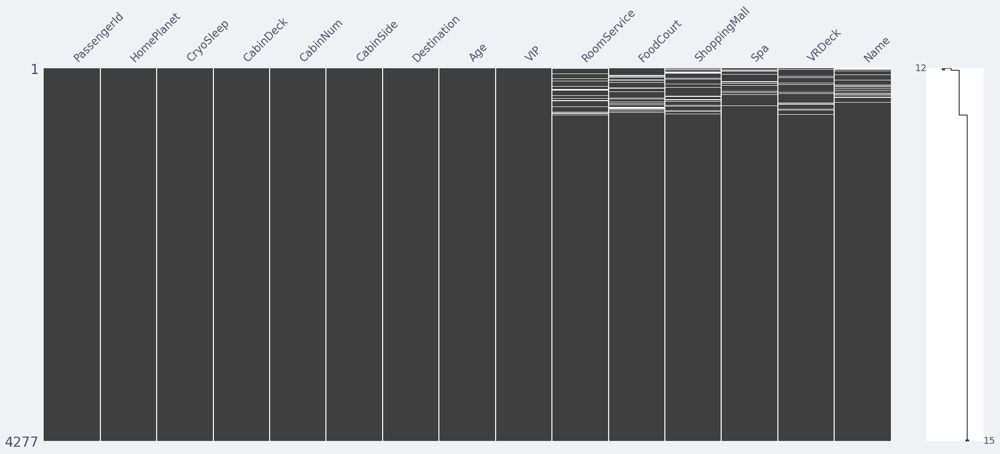

In [86]:
msno.matrix(test, filter='top', sort='ascending')

#### Check RoomService

In [87]:
print('Total missing values (RoomService) in train dataframe: ', train['RoomService'].isna().sum())

print('Total missing values (RoomService) in test dataframe: ', test['RoomService'].isna().sum())

Total missing values (RoomService) in train dataframe:  181
Total missing values (RoomService) in test dataframe:  82


In [88]:
train['RoomService'].describe()

count     8512.000000
mean       224.687617
std        666.717663
min          0.000000
25%          0.000000
50%          0.000000
75%         47.000000
max      14327.000000
Name: RoomService, dtype: float64

In [89]:
train['RoomService'].loc[train['RoomService']>=train['RoomService'].quantile(q=0.75)].count()

2129

In [90]:
train['RoomService'].loc[train['RoomService']<=train['RoomService'].quantile(q=0.75)].count()

6388

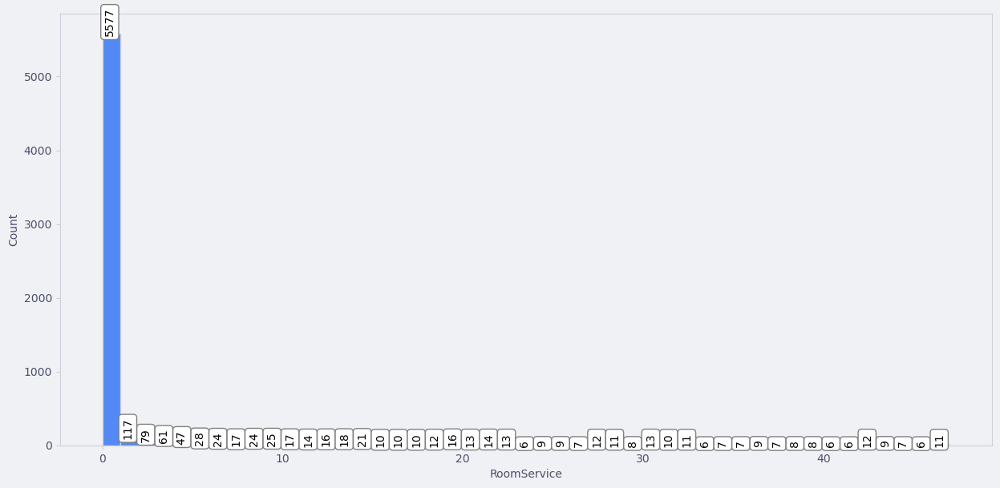

In [91]:
train_q = train.loc[train['RoomService']<=train['RoomService'].quantile(0.75)]

plt.figure(figsize=(15,7))
ax = sns.histplot(data=train_q, x='RoomService', bins=47)

for p in ax.patches:
  ax.annotate(
    '{:.0f}'.format(p.get_height()),
    (p.get_x()+0.1, p.get_height()+1), 
    color='black',
    bbox=bbox,
    rotation=90
    )

In [92]:
train['RoomService'].where(train['RoomService']<5).count()

5881

In [93]:
train['RoomService'] = train['RoomService'].fillna(0)
test['RoomService'] = test['RoomService'].fillna(0)

<AxesSubplot: >

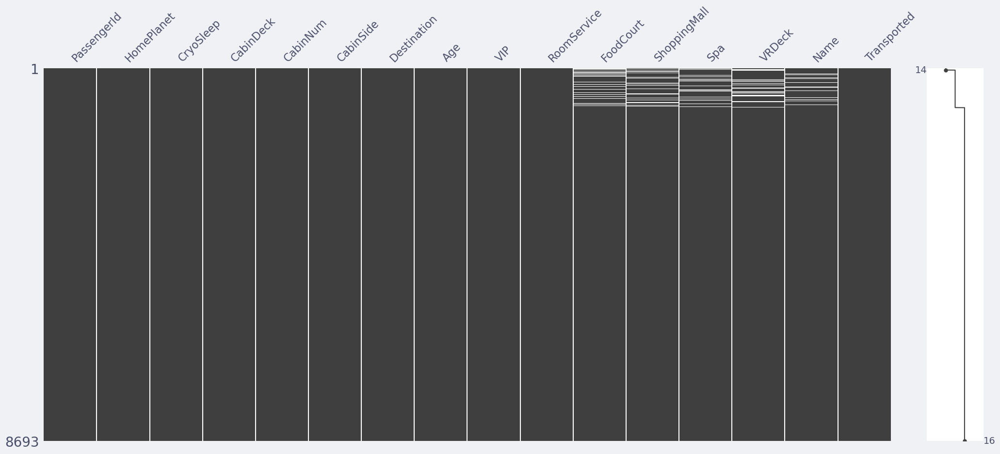

In [94]:
msno.matrix(train, filter='top', sort='ascending')

<AxesSubplot: >

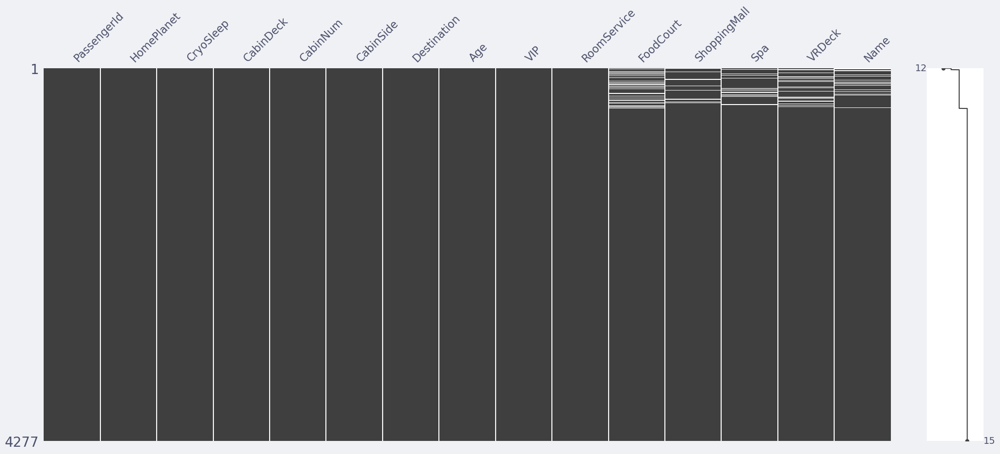

In [95]:
msno.matrix(test, filter='top', sort='ascending')

#### Check FoodCourt

In [96]:
print('Total missing values (FoodCourt) in train dataframe: ', train['FoodCourt'].isna().sum())

print('Total missing values (FoodCourt) in test dataframe: ', test['FoodCourt'].isna().sum())

Total missing values (FoodCourt) in train dataframe:  183
Total missing values (FoodCourt) in test dataframe:  106


In [97]:
train['FoodCourt'].describe()

count     8510.000000
mean       458.077203
std       1611.489240
min          0.000000
25%          0.000000
50%          0.000000
75%         76.000000
max      29813.000000
Name: FoodCourt, dtype: float64

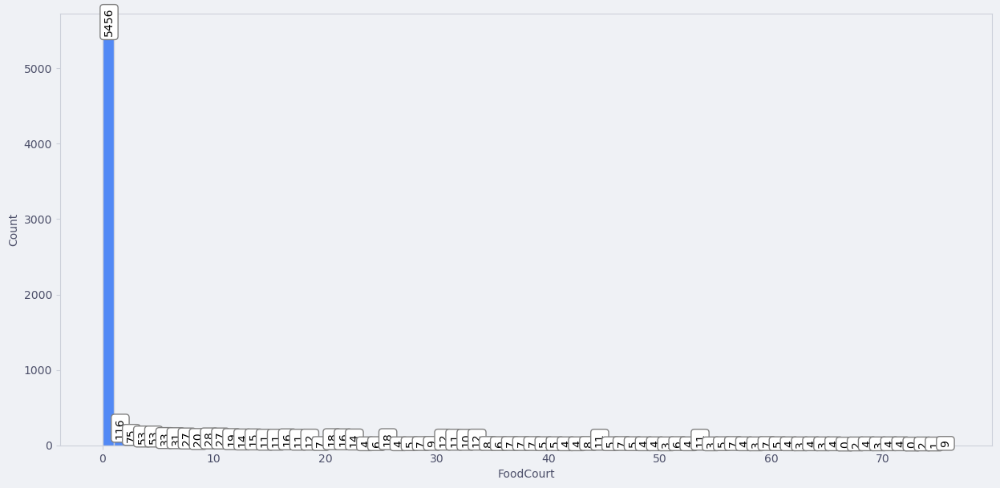

In [98]:
boxplot = train.loc[train['FoodCourt']<=train['FoodCourt'].quantile(q=0.75)]

plt.figure(figsize=(15,7))
ax = sns.histplot(data=boxplot, x='FoodCourt', bins=76)

for p in ax.patches:
  ax.annotate(
    '{:.0f}'.format(p.get_height()),
    (p.get_x()+0.1, p.get_height()+1), 
    color='black',
    bbox=bbox,
    rotation=90
    )

In [99]:
train['FoodCourt'] = train['FoodCourt'].fillna(0)
test['FoodCourt'] = test['FoodCourt'].fillna(0)

<AxesSubplot: >

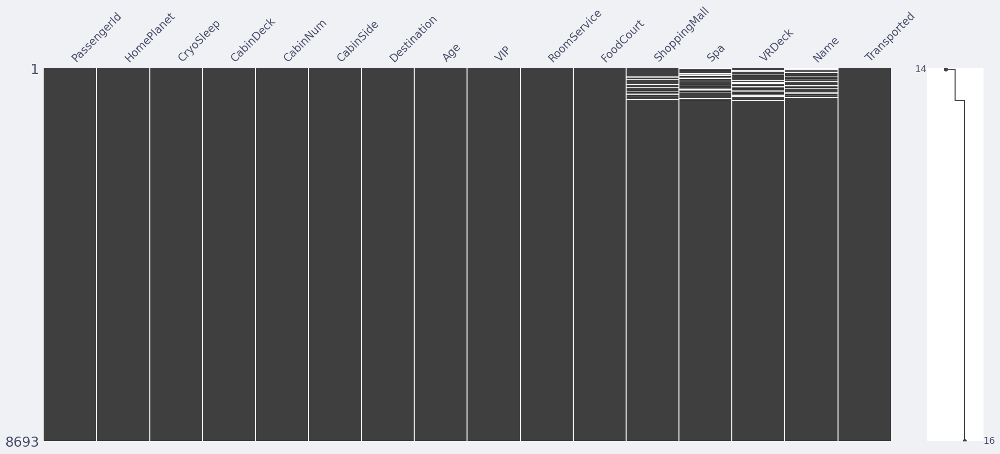

In [100]:
msno.matrix(train, filter='top', sort='ascending')

<AxesSubplot: >

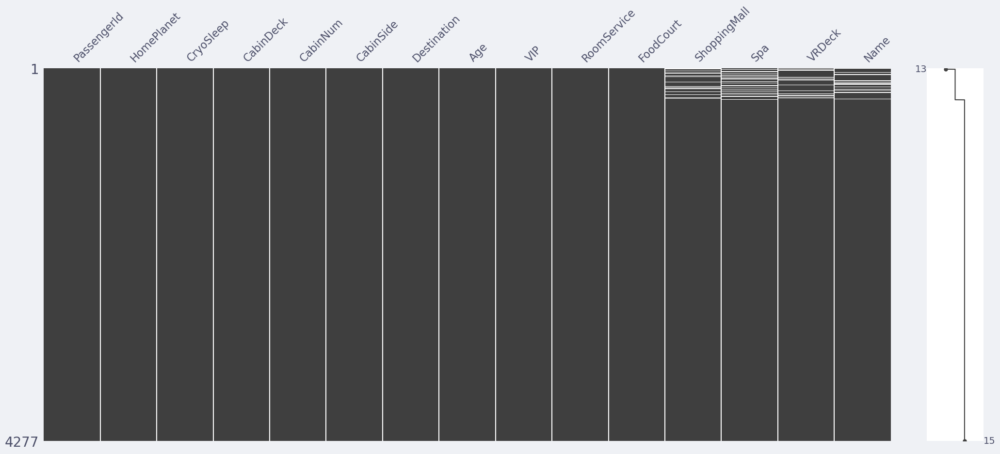

In [101]:
msno.matrix(test, filter='top', sort='ascending')

#### Check ShoppingMall

In [102]:
print('Total missing values (ShoppingMall) in train dataframe: ', train['ShoppingMall'].isna().sum())

print('Total missing values (ShoppingMall) in test dataframe: ', test['ShoppingMall'].isna().sum())

Total missing values (ShoppingMall) in train dataframe:  208
Total missing values (ShoppingMall) in test dataframe:  98


In [103]:
train['ShoppingMall'].describe()

count     8485.000000
mean       173.729169
std        604.696458
min          0.000000
25%          0.000000
50%          0.000000
75%         27.000000
max      23492.000000
Name: ShoppingMall, dtype: float64

In [104]:
train[train['ShoppingMall']==0].count()

PassengerId     5587
HomePlanet      5587
CryoSleep       5587
CabinDeck       5587
CabinNum        5587
CabinSide       5587
Destination     5587
Age             5587
VIP             5587
RoomService     5587
FoodCourt       5587
ShoppingMall    5587
Spa             5473
VRDeck          5471
Name            5457
Transported     5587
dtype: int64

In [105]:
test[test['ShoppingMall']==0].count()

PassengerId     2744
HomePlanet      2744
CryoSleep       2744
CabinDeck       2744
CabinNum        2744
CabinSide       2744
Destination     2744
Age             2744
VIP             2744
RoomService     2744
FoodCourt       2744
ShoppingMall    2744
Spa             2669
VRDeck          2690
Name            2688
dtype: int64

In [106]:
train['ShoppingMall'] = train['ShoppingMall'].fillna(0)
test['ShoppingMall'] = test['ShoppingMall'].fillna(0)

<AxesSubplot: >

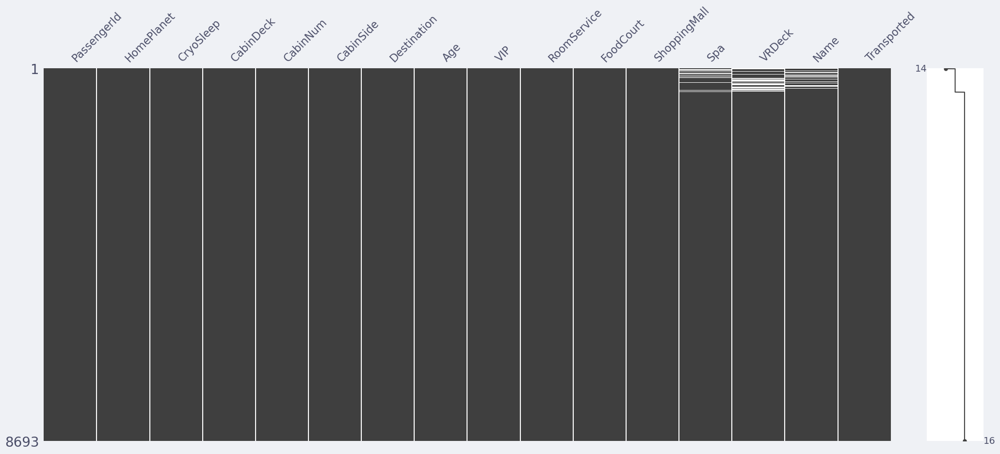

In [107]:
msno.matrix(train, filter='top', sort='ascending')

<AxesSubplot: >

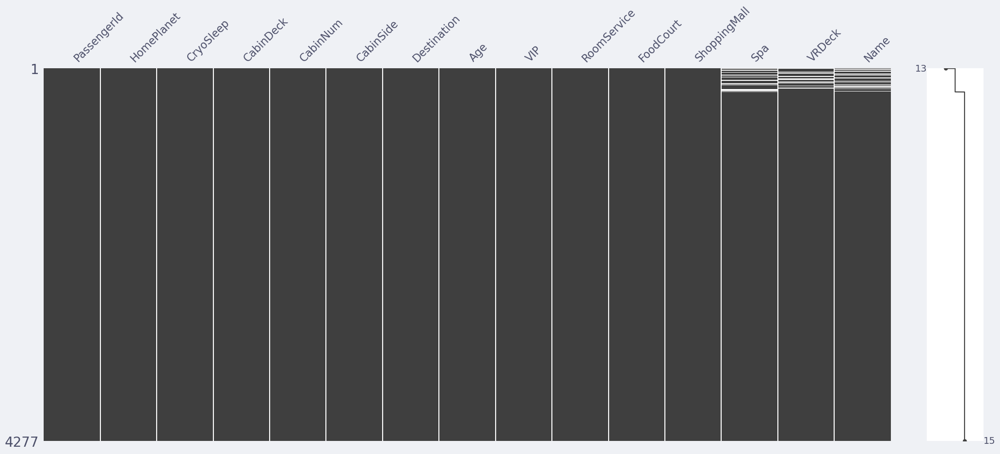

In [108]:
msno.matrix(test, sort='ascending', filter='top')

#### Check SPA

In [109]:
print('Total missing values (Spa) in train dataframe: ', train['Spa'].isna().sum())

print('Total missing values (Spa) in test dataframe: ', test['Spa'].isna().sum())

Total missing values (Spa) in train dataframe:  183
Total missing values (Spa) in test dataframe:  101


In [110]:
train['Spa'].describe()

count     8510.000000
mean       311.138778
std       1136.705535
min          0.000000
25%          0.000000
50%          0.000000
75%         59.000000
max      22408.000000
Name: Spa, dtype: float64

In [111]:
train[train['Spa']==0].count()

PassengerId     5324
HomePlanet      5324
CryoSleep       5324
CabinDeck       5324
CabinNum        5324
CabinSide       5324
Destination     5324
Age             5324
VIP             5324
RoomService     5324
FoodCourt       5324
ShoppingMall    5324
Spa             5324
VRDeck          5196
Name            5201
Transported     5324
dtype: int64

In [112]:
train['Spa'] = train['Spa'].fillna(0)
test['Spa'] = test['Spa'].fillna(0)

<AxesSubplot: >

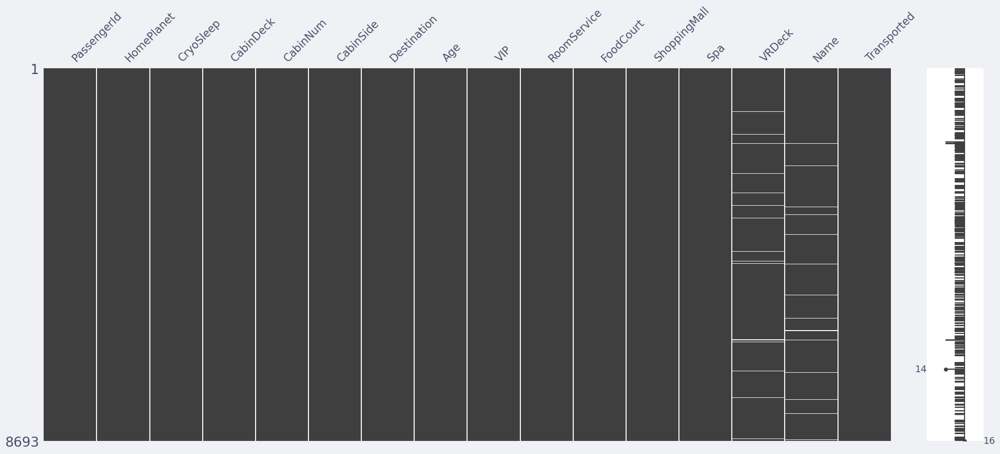

In [113]:
msno.matrix(train)

<AxesSubplot: >

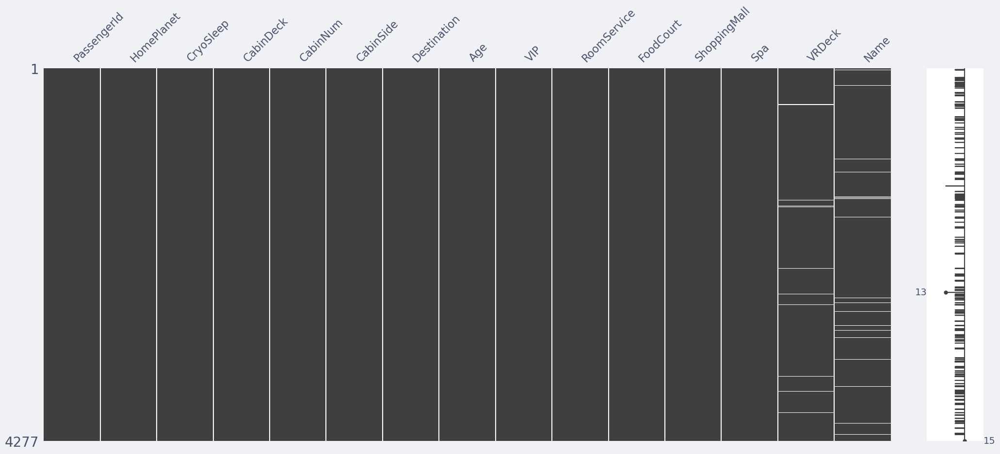

In [114]:
msno.matrix(test)

#### Check VRDeck

In [115]:
print('Total missing values (VRDeck) in train dataframe: ', train['VRDeck'].isna().sum())

print('Total missing values (VRDeck) in test dataframe: ', test['VRDeck'].isna().sum())

Total missing values (VRDeck) in train dataframe:  188
Total missing values (VRDeck) in test dataframe:  80


In [116]:
train['VRDeck'].describe()

count     8505.000000
mean       304.854791
std       1145.717189
min          0.000000
25%          0.000000
50%          0.000000
75%         46.000000
max      24133.000000
Name: VRDeck, dtype: float64

In [117]:
train['VRDeck'] = train['VRDeck'].fillna(0)
test['VRDeck'] = test['VRDeck'].fillna(0)

<AxesSubplot: >

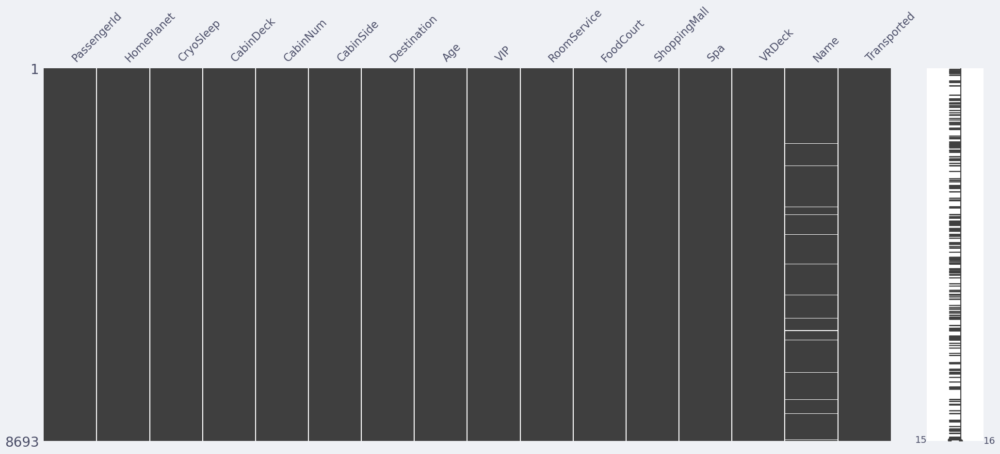

In [118]:
msno.matrix(train)

<AxesSubplot: >

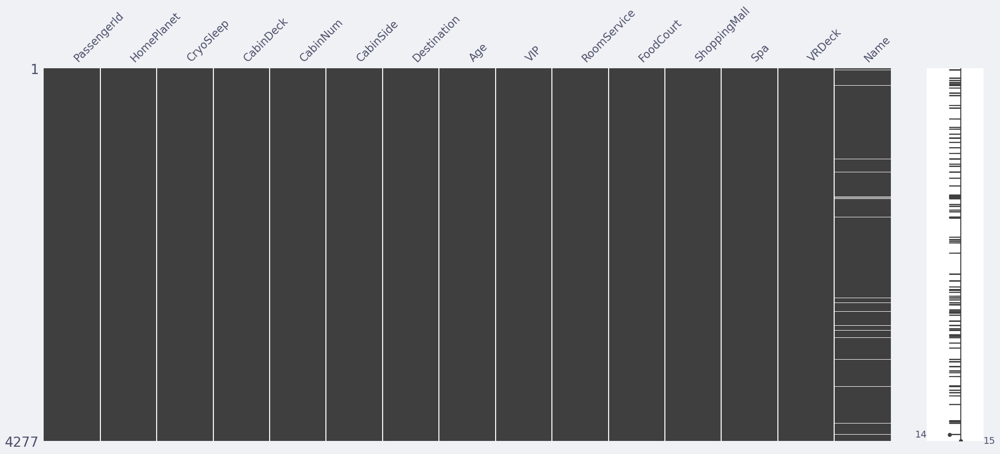

In [119]:
msno.matrix(test)

#### Check Name

In [120]:
print('Total missing values (Name) in train dataframe: ', train['Name'].isna().sum())

print('Total missing values (Name) in test dataframe: ', test['Name'].isna().sum())

Total missing values (Name) in train dataframe:  200
Total missing values (Name) in test dataframe:  94


<AxesSubplot: >

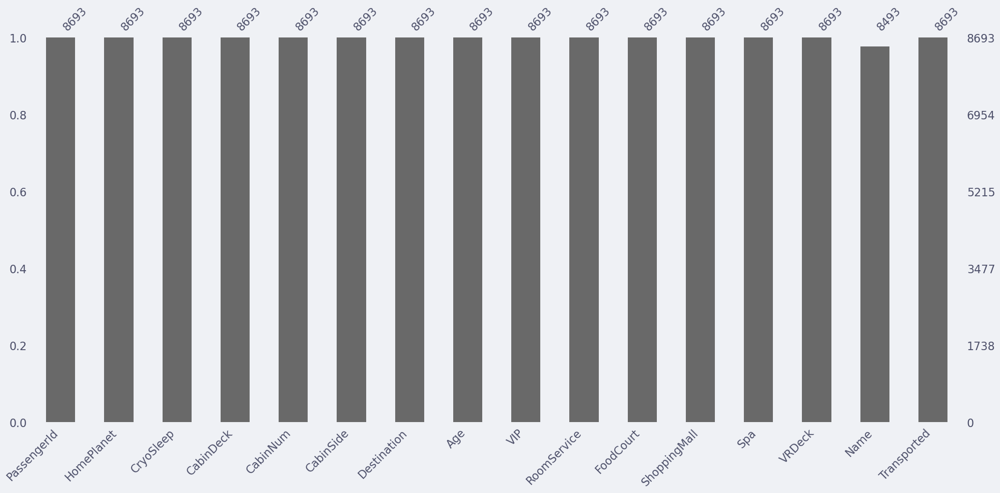

In [121]:
msno.bar(train)

In [122]:
train['Name'].head()

0      Maham Ofracculy
1         Juanna Vines
2        Altark Susent
3         Solam Susent
4    Willy Santantines
Name: Name, dtype: object

In [123]:
pattern = r'(\w+)\s'
train['FirstName'] = train['Name'].str.extract(pat=pattern, expand=False)

pattern_2 = r'\s(\w+)'
train['LastName'] = train['Name'].str.extract(pat=pattern_2, expand=False)
train.head()

,PassengerId,HomePlanet,CryoSleep,CabinDeck,CabinNum,CabinSide,Destination,Age,VIP,RoomService,FoodCourt,ShoppingMall,Spa,VRDeck,Name,Transported,FirstName,LastName
0,0001_01,Europa,False,B,0,P,TRAPPIST-1e,39.0,False,0.0,0.0,0.0,0.0,0.0,Maham Ofracculy,False,Maham,Ofracculy
1,0002_01,Earth,False,F,0,S,TRAPPIST-1e,24.0,False,109.0,9.0,25.0,549.0,44.0,Juanna Vines,True,Juanna,Vines
2,0003_01,Europa,False,A,0,S,TRAPPIST-1e,58.0,True,43.0,3576.0,0.0,6715.0,49.0,Altark Susent,False,Altark,Susent
3,0003_02,Europa,False,A,0,S,TRAPPIST-1e,33.0,False,0.0,1283.0,371.0,3329.0,193.0,Solam Susent,False,Solam,Susent
4,0004_01,Earth,False,F,1,S,TRAPPIST-1e,16.0,False,303.0,70.0,151.0,565.0,2.0,Willy Santantines,True,Willy,Santantines


In [124]:
train = train.drop(['Name', 'LastName', 'FirstName'], axis=1)
test = test.drop('Name', axis=1)

<AxesSubplot: >

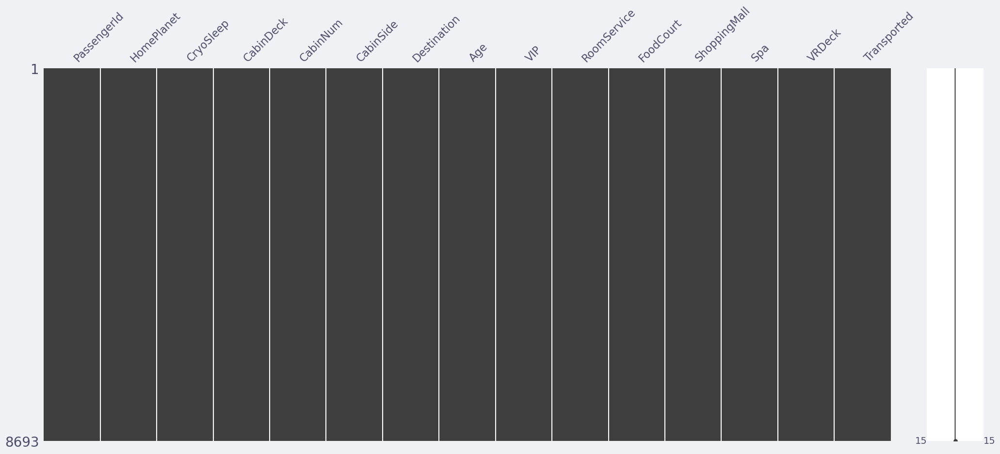

In [125]:
msno.matrix(train)

<AxesSubplot: >

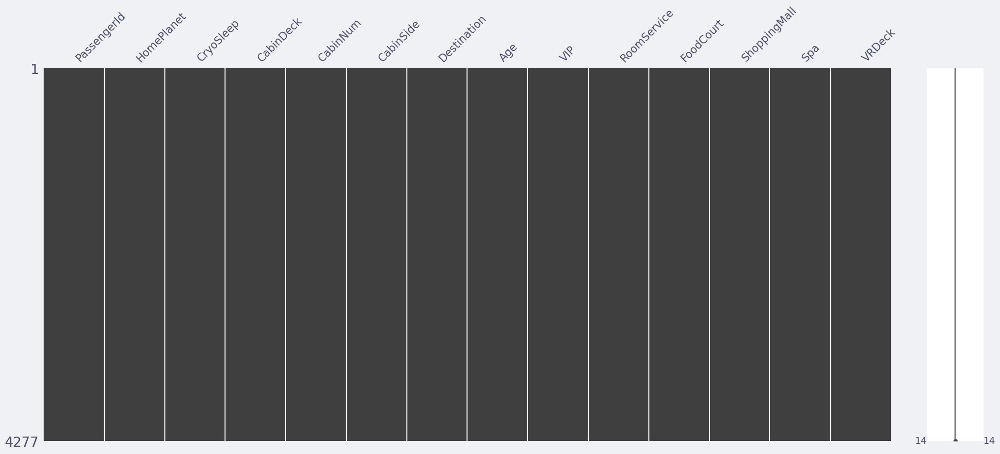

In [126]:
msno.matrix(test)

### Feature Engineering

<AxesSubplot: xlabel='HomePlanet', ylabel='count'>

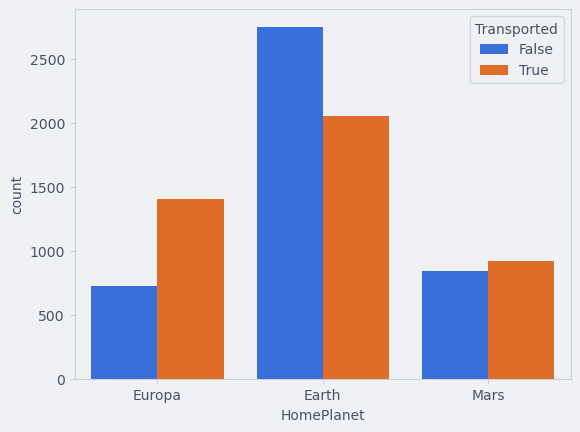

In [127]:
sns.countplot(data=train, x='HomePlanet', hue='Transported')

<AxesSubplot: >

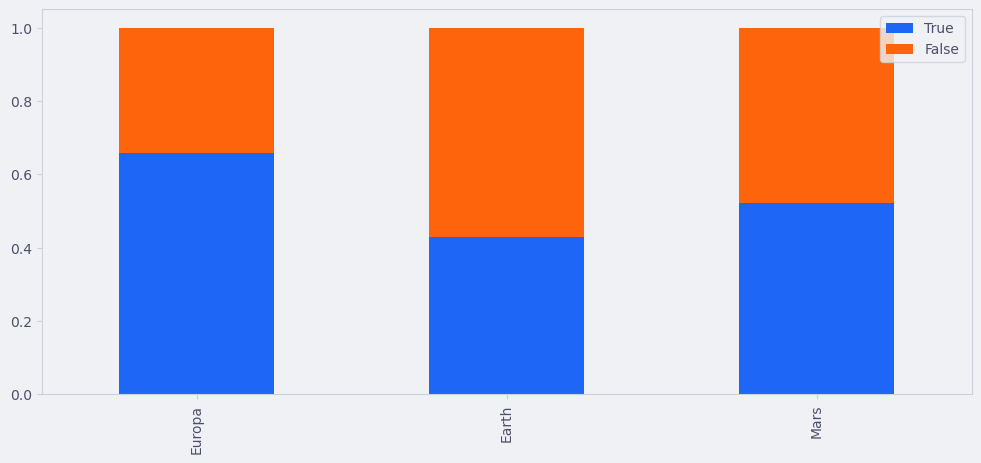

In [128]:
europa = train[train['HomePlanet']=='Europa']['Transported'].value_counts()

earth = train[train['HomePlanet']=='Earth']['Transported'].value_counts()

mars = train[train['HomePlanet']=='Mars']['Transported'].value_counts()

europa = europa/sum(europa)
earth = earth/sum(earth)
mars = mars/sum(mars)

df_homeplanet = pd.DataFrame(
  data=[europa, earth, mars],
  index=['Europa', 'Earth', 'Mars']
)

df_homeplanet.plot(kind='bar', stacked=True, figsize=(12,5))

In [129]:
map_homeplanet = {'Europa':0, 'Earth':1, 'Mars':1}

train['HomePlanet'] = train['HomePlanet'].map(map_homeplanet)
test['HomePlanet'] = test['HomePlanet'].map(map_homeplanet)
train['HomePlanet'].value_counts()

1    6562
0    2131
Name: HomePlanet, dtype: int64

<AxesSubplot: xlabel='CryoSleep', ylabel='count'>

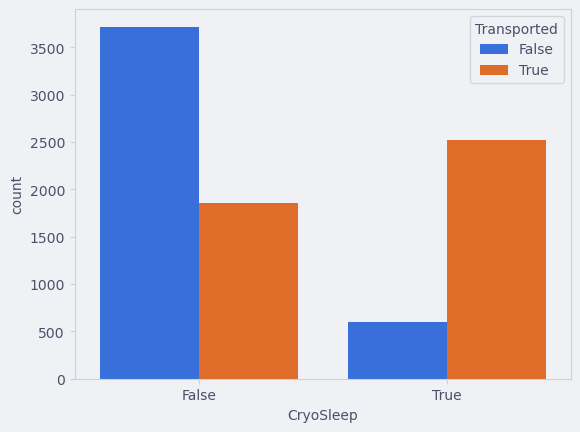

In [130]:
sns.countplot(data=train, x='CryoSleep', hue='Transported')

In [131]:
map_cryo = {False:0, True:1}

train['CryoSleep'] = train['CryoSleep'].map(map_cryo)
test['CryoSleep'] = test['CryoSleep'].map(map_cryo)

train['CryoSleep'].value_counts()

0    5578
1    3115
Name: CryoSleep, dtype: int64

<AxesSubplot: xlabel='CabinDeck', ylabel='count'>

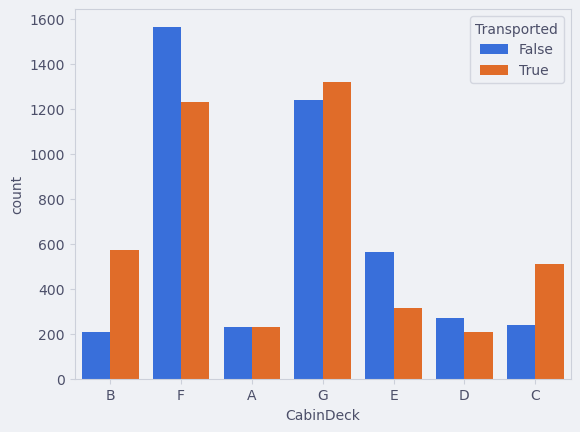

In [132]:
sns.countplot(data=train, x='CabinDeck', hue='Transported')

<AxesSubplot: >

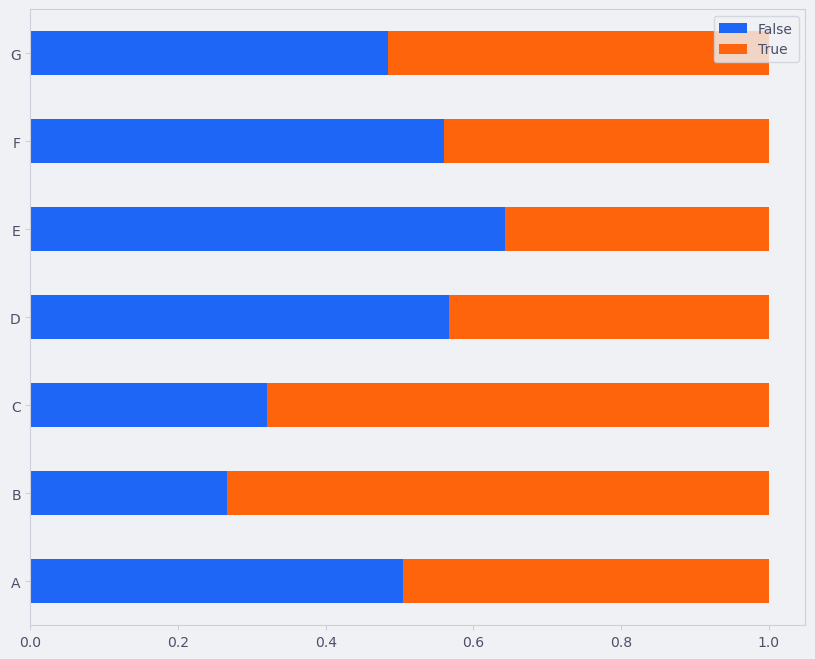

In [133]:
A = train[train['CabinDeck']=='A']['Transported'].value_counts()
B = train[train['CabinDeck']=='B']['Transported'].value_counts()
C = train[train['CabinDeck']=='C']['Transported'].value_counts()
D = train[train['CabinDeck']=='D']['Transported'].value_counts()
E = train[train['CabinDeck']=='E']['Transported'].value_counts()
F = train[train['CabinDeck']=='F']['Transported'].value_counts()
G = train[train['CabinDeck']=='G']['Transported'].value_counts()

A = A/sum(A)
B = B/sum(B)
C = C/sum(C)
D = D/sum(D)
E = E/sum(E)
F = F/sum(F)
G = G/sum(G)

df_cabindeck = pd.DataFrame(
  data=[A,B,C,D,E,F,G],
  index=['A','B','C','D','E','F','G']
)

df_cabindeck.plot(kind='barh', stacked=True, figsize=(10,8))

In [134]:
map_deck = {'A':2, 'B':1, 'C':1, 'D':0, 'E':0, 'F':0, 'G':1}

train['CabinDeck'] = train['CabinDeck'].map(map_deck)
test['CabinDeck'] = test['CabinDeck'].map(map_deck)

train['CabinDeck'].value_counts()

0    4148
1    4085
2     460
Name: CabinDeck, dtype: int64

In [136]:
train['Age'].loc[train['Age']<=17]=1
train['Age'].loc[train['Age']>17]=0

test['Age'].loc[test['Age']<=17]=1
test['Age'].loc[test['Age']>17]=0

/var/folders/__/58jr0ft96x74h5n7dl_4rp0h0000gn/T/ipykernel_5813/2813279455.py:1: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

/var/folders/__/58jr0ft96x74h5n7dl_4rp0h0000gn/T/ipykernel_5813/2813279455.py:2: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

/var/folders/__/58jr0ft96x74h5n7dl_4rp0h0000gn/T/ipykernel_5813/2813279455.py:4: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

/var/folders/__/58jr0ft96x74h5n7dl_4rp0h0000gn/T/ipykernel

In [137]:
train.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8693 entries, 0 to 8692
Data columns (total 15 columns):
 #   Column        Non-Null Count  Dtype  
---  ------        --------------  -----  
 0   PassengerId   8693 non-null   object 
 1   HomePlanet    8693 non-null   int64  
 2   CryoSleep     8693 non-null   int64  
 3   CabinDeck     8693 non-null   int64  
 4   CabinNum      8693 non-null   int64  
 5   CabinSide     8693 non-null   object 
 6   Destination   8693 non-null   object 
 7   Age           8693 non-null   float64
 8   VIP           8693 non-null   bool   
 9   RoomService   8693 non-null   float64
 10  FoodCourt     8693 non-null   float64
 11  ShoppingMall  8693 non-null   float64
 12  Spa           8693 non-null   float64
 13  VRDeck        8693 non-null   float64
 14  Transported   8693 non-null   bool   
dtypes: bool(2), float64(6), int64(4), object(3)
memory usage: 900.0+ KB


<AxesSubplot: xlabel='CabinNum', ylabel='Count'>

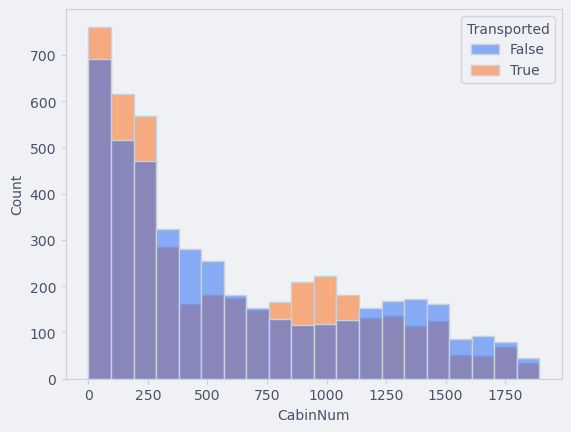

In [138]:
sns.histplot(data=train, x='CabinNum', hue='Transported', bins=20)

In [140]:
train['CabinNum'].loc[train['CabinNum'].between(left=0, right=299, inclusive='both')] = 1
train['CabinNum'].loc[train['CabinNum'].between(left=300, right=500, inclusive='both')] = 0
train['CabinNum'].loc[train['CabinNum'].between(left=600, right=1999, inclusive='both')] = 1
train['CabinNum'].loc[train['CabinNum']>2000] = 0

test['CabinNum'] = test['CabinNum'].astype(int)
test['CabinNum'].loc[test['CabinNum'].between(left=0, right=299, inclusive='both')] = 1
test['CabinNum'].loc[test['CabinNum'].between(left=300, right=500, inclusive='both')] = 0
test['CabinNum'].loc[test['CabinNum'].between(left=600, right=1999, inclusive='both')] = 1
test['CabinNum'].loc[test['CabinNum']>2000] = 0

/var/folders/__/58jr0ft96x74h5n7dl_4rp0h0000gn/T/ipykernel_5813/2568752316.py:1: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

/var/folders/__/58jr0ft96x74h5n7dl_4rp0h0000gn/T/ipykernel_5813/2568752316.py:2: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

/var/folders/__/58jr0ft96x74h5n7dl_4rp0h0000gn/T/ipykernel_5813/2568752316.py:3: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

/var/folders/__/58jr0ft96x74h5n7dl_4rp0h0000gn/T/ipykernel

In [141]:
train.dtypes

PassengerId      object
HomePlanet        int64
CryoSleep         int64
CabinDeck         int64
CabinNum          int64
CabinSide        object
Destination      object
Age             float64
VIP                bool
RoomService     float64
FoodCourt       float64
ShoppingMall    float64
Spa             float64
VRDeck          float64
Transported        bool
dtype: object

<AxesSubplot: xlabel='CabinSide', ylabel='count'>

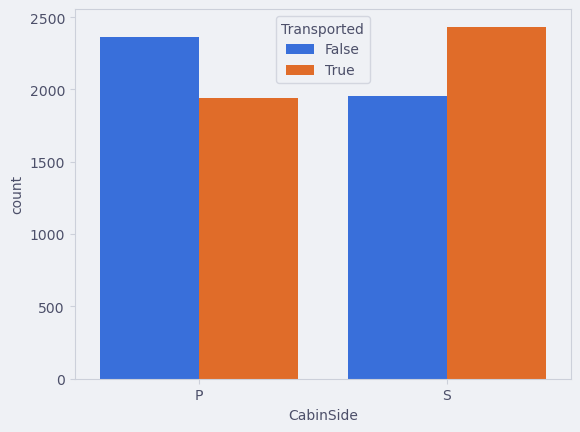

In [142]:
sns.countplot(data=train, x='CabinSide', hue='Transported')

In [143]:
train['CabinSide'] = train['CabinSide'].map({
  'P':0,
  'S':1
}
)

test['CabinSide'] = test['CabinSide'].map({
  'P':0,
  'S':1
}
)

train['CabinSide'].head()

0    0
1    1
2    1
3    1
4    1
Name: CabinSide, dtype: int64

<AxesSubplot: xlabel='Destination', ylabel='count'>

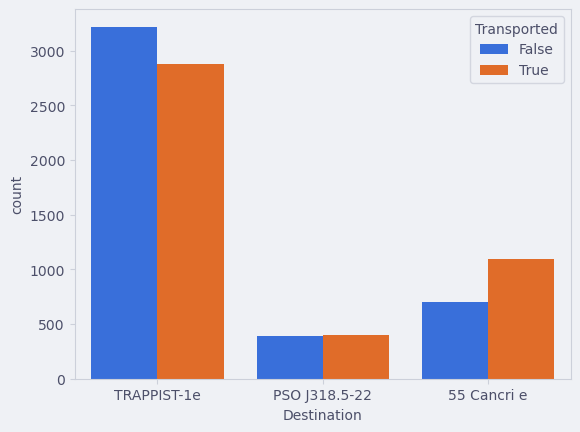

In [144]:
sns.countplot(data=train, x='Destination', hue='Transported')

In [145]:
train['Destination'].value_counts()

TRAPPIST-1e      6097
55 Cancri e      1800
PSO J318.5-22     796
Name: Destination, dtype: int64

In [146]:
map_destin = {'TRAPPIST-1e':0, '55 Cancri e':1, 'PSO J318.5-22':1}

train['Destination'] = train['Destination'].map(map_destin)
test['Destination'] = test['Destination'].map(map_destin)

train['Destination'].head()

0    0
1    0
2    0
3    0
4    0
Name: Destination, dtype: int64

<AxesSubplot: xlabel='VIP', ylabel='count'>

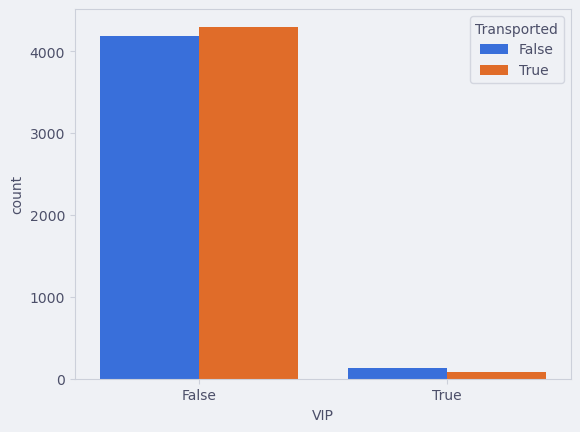

In [147]:
sns.countplot(data=train, x='VIP', hue='Transported')

In [148]:
train['VIP'] = train['VIP'].map({False:0, True:1})
test['VIP'] = test['VIP'].map({False:0, True:1})
train['VIP'].head()

0    0
1    0
2    1
3    0
4    0
Name: VIP, dtype: int64

In [149]:
train.dtypes

PassengerId      object
HomePlanet        int64
CryoSleep         int64
CabinDeck         int64
CabinNum          int64
CabinSide         int64
Destination       int64
Age             float64
VIP               int64
RoomService     float64
FoodCourt       float64
ShoppingMall    float64
Spa             float64
VRDeck          float64
Transported        bool
dtype: object

In [151]:
train['RoomService'].loc[train['RoomService']<=3992] = 1
train['RoomService'].loc[train['RoomService']>3992] = 0

test['RoomService'].loc[test['RoomService']<=3992] = 1
test['RoomService'].loc[test['RoomService']>3992] = 0

/var/folders/__/58jr0ft96x74h5n7dl_4rp0h0000gn/T/ipykernel_5813/1356220833.py:1: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

/var/folders/__/58jr0ft96x74h5n7dl_4rp0h0000gn/T/ipykernel_5813/1356220833.py:2: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

/var/folders/__/58jr0ft96x74h5n7dl_4rp0h0000gn/T/ipykernel_5813/1356220833.py:4: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

/var/folders/__/58jr0ft96x74h5n7dl_4rp0h0000gn/T/ipykernel

In [153]:
train['FoodCourt'].loc[train['FoodCourt']>=5000] = 1
train['FoodCourt'].loc[train['FoodCourt']<5000] = 0

test['FoodCourt'].loc[test['FoodCourt']>=5000] = 1
test['FoodCourt'].loc[test['FoodCourt']<5000] = 0

/var/folders/__/58jr0ft96x74h5n7dl_4rp0h0000gn/T/ipykernel_5813/2299881954.py:1: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

/var/folders/__/58jr0ft96x74h5n7dl_4rp0h0000gn/T/ipykernel_5813/2299881954.py:2: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

/var/folders/__/58jr0ft96x74h5n7dl_4rp0h0000gn/T/ipykernel_5813/2299881954.py:4: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

/var/folders/__/58jr0ft96x74h5n7dl_4rp0h0000gn/T/ipykernel

In [154]:
test['FoodCourt'].head()

0    0.0
1    0.0
2    0.0
3    0.0
4    0.0
Name: FoodCourt, dtype: float64

In [156]:
train['ShoppingMall'].loc[train['ShoppingMall']<=5000] = 0
train['ShoppingMall'].loc[train['ShoppingMall']>5000] = 1

test['ShoppingMall'].loc[test['ShoppingMall']<=5000] = 0
test['ShoppingMall'].loc[test['ShoppingMall']>5000] = 1

/var/folders/__/58jr0ft96x74h5n7dl_4rp0h0000gn/T/ipykernel_5813/3081891272.py:1: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

/var/folders/__/58jr0ft96x74h5n7dl_4rp0h0000gn/T/ipykernel_5813/3081891272.py:2: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

/var/folders/__/58jr0ft96x74h5n7dl_4rp0h0000gn/T/ipykernel_5813/3081891272.py:4: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

/var/folders/__/58jr0ft96x74h5n7dl_4rp0h0000gn/T/ipykernel

In [158]:
train['Spa'].loc[train['Spa']<=5000] = 1
train['Spa'].loc[train['Spa']>5000] = 0

test['Spa'].loc[test['Spa']<=5000] = 1
test['Spa'].loc[test['Spa']>5000] = 0

/var/folders/__/58jr0ft96x74h5n7dl_4rp0h0000gn/T/ipykernel_5813/869606373.py:1: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

/var/folders/__/58jr0ft96x74h5n7dl_4rp0h0000gn/T/ipykernel_5813/869606373.py:2: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

/var/folders/__/58jr0ft96x74h5n7dl_4rp0h0000gn/T/ipykernel_5813/869606373.py:4: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

/var/folders/__/58jr0ft96x74h5n7dl_4rp0h0000gn/T/ipykernel_58

In [159]:
train.dtypes

PassengerId      object
HomePlanet        int64
CryoSleep         int64
CabinDeck         int64
CabinNum          int64
CabinSide         int64
Destination       int64
Age             float64
VIP               int64
RoomService     float64
FoodCourt       float64
ShoppingMall    float64
Spa             float64
VRDeck          float64
Transported        bool
dtype: object

In [160]:
fig = px.violin(data_frame=train, x='Transported', y='VRDeck', box=True, points='all')
fig.show()

In [161]:
train['VRDeck'].loc[train['VRDeck']<=5000] = 1
train['VRDeck'].loc[train['VRDeck']>5000] = 0

test['VRDeck'].loc[test['VRDeck']<=5000] = 1
test['VRDeck'].loc[test['VRDeck']>5000] = 0

/var/folders/__/58jr0ft96x74h5n7dl_4rp0h0000gn/T/ipykernel_5813/1425683580.py:1: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

/var/folders/__/58jr0ft96x74h5n7dl_4rp0h0000gn/T/ipykernel_5813/1425683580.py:2: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

/var/folders/__/58jr0ft96x74h5n7dl_4rp0h0000gn/T/ipykernel_5813/1425683580.py:4: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

/var/folders/__/58jr0ft96x74h5n7dl_4rp0h0000gn/T/ipykernel

In [162]:
train['Transported'].value_counts()

True     4378
False    4315
Name: Transported, dtype: int64

In [163]:
train['Transported'] = train['Transported'].map({False:0, True:1})
train['Transported'].head()

0    0
1    1
2    0
3    0
4    1
Name: Transported, dtype: int64

### ML Model

In [164]:
train.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8693 entries, 0 to 8692
Data columns (total 15 columns):
 #   Column        Non-Null Count  Dtype  
---  ------        --------------  -----  
 0   PassengerId   8693 non-null   object 
 1   HomePlanet    8693 non-null   int64  
 2   CryoSleep     8693 non-null   int64  
 3   CabinDeck     8693 non-null   int64  
 4   CabinNum      8693 non-null   int64  
 5   CabinSide     8693 non-null   int64  
 6   Destination   8693 non-null   int64  
 7   Age           8693 non-null   float64
 8   VIP           8693 non-null   int64  
 9   RoomService   8693 non-null   float64
 10  FoodCourt     8693 non-null   float64
 11  ShoppingMall  8693 non-null   float64
 12  Spa           8693 non-null   float64
 13  VRDeck        8693 non-null   float64
 14  Transported   8693 non-null   int64  
dtypes: float64(6), int64(8), object(1)
memory usage: 1018.8+ KB


In [ ]:
test.info()

In [165]:
train_corr = train.corr()
train_corr

/var/folders/__/58jr0ft96x74h5n7dl_4rp0h0000gn/T/ipykernel_5813/2424225176.py:1: FutureWarning:

The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.



,HomePlanet,CryoSleep,CabinDeck,CabinNum,CabinSide,Destination,Age,VIP,RoomService,FoodCourt,ShoppingMall,Spa,VRDeck,Transported
HomePlanet,1.000000,-0.095024,-0.409960,0.114905,-0.036949,-0.156958,0.150916,-0.144839,0.027124,NaN,-0.044158,0.171133,0.184748,-0.176916
CryoSleep,-0.095024,1.000000,0.252814,-0.024707,0.020283,0.112578,0.121978,-0.074642,0.047941,NaN,-0.032090,0.079383,0.081651,0.455925
CabinDeck,-0.409960,0.252814,1.000000,-0.077499,0.027232,0.150108,0.088219,0.064917,-0.001119,NaN,0.003574,-0.072465,-0.083932,0.130794
CabinNum,0.114905,-0.024707,-0.077499,1.000000,-0.017157,-0.020955,0.026019,-0.015562,0.001644,NaN,-0.010115,0.025039,0.017025,-0.033827
CabinSide,-0.036949,0.020283,0.027232,-0.017157,1.000000,0.007696,0.015616,-0.009115,-0.001006,NaN,-0.011156,0.006515,0.009405,0.102893
Destination,-0.156958,0.112578,0.150108,-0.020955,0.007696,1.000000,0.012240,0.041642,0.000895,NaN,-0.004563,-0.031186,-0.040274,0.096319
Age,0.150916,0.121978,0.088219,0.026019,0.015616,0.012240,1.000000,-0.068095,0.010044,NaN,0.001098,0.043657,0.046712,0.117301
VIP,-0.144839,-0.074642,0.064917,-0.015562,-0.009115,0.041642,-0.068095,1.000000,-0.022602,NaN,-0.006657,-0.019704,-0.106099,-0.036080
RoomService,0.027124,0.047941,-0.001119,0.001644,-0.001006,0.000895,0.010044,-0.022602,1.000000,NaN,0.002956,0.024655,-0.007721,0.069340
FoodCourt,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [166]:
from sklearn.model_selection import train_test_split

X = train.drop(['Transported', 'PassengerId', 'CabinNum', 'VIP', 'FoodCourt', 'ShoppingMall'], axis=1)
y = train['Transported']

X_train, X_val, y_train, y_val = train_test_split(X, y, train_size=0.9)

print(X_train.shape)
print(X_val.shape)
print(y_train.shape)
print(y_val.shape)

(7823, 9)
(870, 9)
(7823,)
(870,)


In [167]:
from sklearn.tree import DecisionTreeClassifier

clf_dt = DecisionTreeClassifier(max_depth=2, class_weight='balanced')

clf_dt.fit(X_train, y_train)

DecisionTreeClassifier(class_weight='balanced', max_depth=2)

In [168]:
from sklearn.metrics import roc_auc_score, f1_score, classification_report

y_pred = clf_dt.predict(X_val)
print(f'ROC-AUC in X_val - DecisionTreeClassifier:\t {np.round(roc_auc_score(y_val, y_pred),2)}')


ROC-AUC in X_val - DecisionTreeClassifier:	 0.72


In [169]:
print(classification_report(y_val, y_pred))

              precision    recall  f1-score   support

           0       0.65      0.88      0.75       416
           1       0.83      0.57      0.68       454

    accuracy                           0.72       870
   macro avg       0.74      0.72      0.71       870
weighted avg       0.75      0.72      0.71       870



In [170]:
from sklearn.model_selection import GridSearchCV

params_dt = {
  'min_samples_split':[8, 9, 10],
  'min_samples_leaf':[14, 15, 16],
  'max_depth':[15, 16, 17],
  'criterion':['gini', 'entropy'],
  'class_weight':['balanced', None]
}

grid_search_dt = GridSearchCV(
  clf_dt,
  scoring='roc_auc',
  param_grid=params_dt,
  cv=5,
  return_train_score=True,
  n_jobs=-1
)

grid_search_dt.fit(X_train, y_train)

GridSearchCV(cv=5,
             estimator=DecisionTreeClassifier(class_weight='balanced',
                                              max_depth=2),
             n_jobs=-1,
             param_grid={'class_weight': ['balanced', None],
                         'criterion': ['gini', 'entropy'],
                         'max_depth': [15, 16, 17],
                         'min_samples_leaf': [14, 15, 16],
                         'min_samples_split': [8, 9, 10]},
             return_train_score=True, scoring='roc_auc')

In [171]:
def fun_plot_grid_results(df):
  cm = sns.diverging_palette(5, 250, as_cmap=True)
  return(
    pd.concat([df['params'].apply(pd.Series), df[['mean_train_score', 'mean_test_score', 'rank_test_score']]], axis=1)
    .sort_values(by='rank_test_score')
    .style.background_gradient(
      cmap=cm,
      subset=['mean_train_score', 'mean_test_score']
    )
  )

df_best_params_dt = pd.DataFrame(grid_search_dt.cv_results_)

results_table_dt = fun_plot_grid_results(df_best_params_dt)

results_table_dt

,class_weight,criterion,max_depth,min_samples_leaf,min_samples_split,mean_train_score,mean_test_score,rank_test_score
60,None,gini,15,16,8,0.802850,0.797337,1
69,None,gini,16,16,8,0.802850,0.797337,1
71,None,gini,16,16,10,0.802850,0.797337,1
79,None,gini,17,16,9,0.802850,0.797337,1
80,None,gini,17,16,10,0.802850,0.797337,1
6,balanced,gini,15,16,8,0.802850,0.797336,6
8,balanced,gini,15,16,10,0.802850,0.797336,6
26,balanced,gini,17,16,10,0.802850,0.797336,6
70,None,gini,16,16,9,0.802850,0.797317,9
78,None,gini,17,16,8,0.802850,0.797317,9


In [173]:
best_model_dt = grid_search_dt.best_estimator_
best_model_dt

DecisionTreeClassifier(max_depth=15, min_samples_leaf=16, min_samples_split=8)

In [181]:
y_preds_best_dt = best_model_dt.predict(X_val)
print(f'ROC-AUC X_val - best_model_dt:\t {np.round(roc_auc_score(y_val, y_preds_best_dt),2)}')
print(f'F1 score - best_mode_dt:\t {np.round(f1_score(y_val, y_preds_best_dt),2)}')

ROC-AUC X_val - best_model_dt:	 0.74
F1 score - best_mode_dt:	 0.71


In [177]:
print(classification_report(y_val, y_preds_best_dt))

              precision    recall  f1-score   support

           0       0.67      0.86      0.75       416
           1       0.83      0.61      0.71       454

    accuracy                           0.73       870
   macro avg       0.75      0.74      0.73       870
weighted avg       0.75      0.73      0.73       870



/Users/alejandrodelgado/kaggle/kaggle_env/lib/python3.10/site-packages/sklearn/base.py:420: UserWarning:

X does not have valid feature names, but DecisionTreeClassifier was fitted with feature names

/Users/alejandrodelgado/kaggle/kaggle_env/lib/python3.10/site-packages/sklearn/base.py:420: UserWarning:

X does not have valid feature names, but DecisionTreeClassifier was fitted with feature names

/Users/alejandrodelgado/kaggle/kaggle_env/lib/python3.10/site-packages/sklearn/base.py:420: UserWarning:

X does not have valid feature names, but DecisionTreeClassifier was fitted with feature names

/Users/alejandrodelgado/kaggle/kaggle_env/lib/python3.10/site-packages/sklearn/base.py:420: UserWarning:

X does not have valid feature names, but DecisionTreeClassifier was fitted with feature names



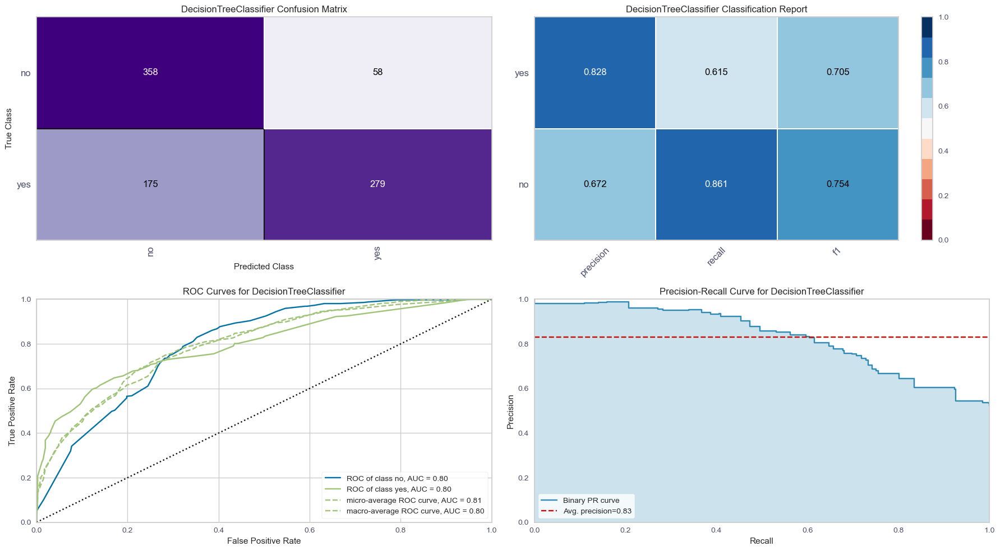

In [178]:
from yellowbrick.classifier import ConfusionMatrix, ClassificationReport, ROCAUC, PrecisionRecallCurve, DiscriminationThreshold

fig, axs = plt.subplots(nrows=2, ncols=2, figsize=(18,10))

visual_grid_dt = [
  ConfusionMatrix(best_model_dt, classes=['no', 'yes'], cmap='Purples', ax=axs[0,0]),
  ClassificationReport(best_model_dt, classes=['no', 'yes'], support=False, cmap='RdBu', ax=axs[0,1]),
  ROCAUC(best_model_dt, classes=['no', 'yes'], ax=axs[1,0]),
  PrecisionRecallCurve(best_model_dt, ax=axs[1,1])
]

for v in visual_grid_dt:
  v.fit(X_train, y_train)
  v.score(X_val, y_val)
  v.finalize()

plt.tight_layout()

In [179]:
from sklearn.ensemble import RandomForestClassifier

clf_rf = RandomForestClassifier(class_weight='balanced', max_depth=2, n_jobs=-1)
clf_rf.fit(X_train, y_train)

RandomForestClassifier(class_weight='balanced', max_depth=2, n_jobs=-1)

In [183]:
y_pred_rf = clf_rf.predict(X_val)

print(f'ROC-AUC in X_Val:\t {np.round(roc_auc_score(y_val, y_pred_rf),2)}')
print(f'F1 Score - clf_rf:\t  {np.round(f1_score(y_val, y_pred_rf),2)}')

ROC-AUC in X_Val:	 0.72
F1 Score - clf_rf:	  0.68


In [184]:
params_rf = {
  'max_depth':[22, 23, 24],
  'min_samples_split':[9, 10, 11],
  'min_samples_leaf':[1, 2, 4],
  'n_estimators':[100, 200, 300],
  'max_features':['sqrt', 'log2', None],
  'class_weight':['balanced', 'balanced_subsample', None]
}

grid_search_rf = GridSearchCV(
  clf_rf,
  scoring='roc_auc',
  param_grid=params_rf,
  cv=5,
  return_train_score=True,
  n_jobs=-1,
  verbose=3
)

grid_search_rf.fit(X_train, y_train)

Fitting 5 folds for each of 729 candidates, totalling 3645 fits
[CV 2/5] END class_weight=balanced, max_depth=22, max_features=sqrt, min_samples_leaf=1, min_samples_split=9, n_estimators=100;, score=(train=0.807, test=0.802) total time=   0.3s
[CV 1/5] END class_weight=balanced, max_depth=22, max_features=sqrt, min_samples_leaf=1, min_samples_split=9, n_estimators=100;, score=(train=0.810, test=0.784) total time=   0.3s
[CV 3/5] END class_weight=balanced, max_depth=22, max_features=sqrt, min_samples_leaf=1, min_samples_split=9, n_estimators=100;, score=(train=0.811, test=0.782) total time=   0.3s
[CV 5/5] END class_weight=balanced, max_depth=22, max_features=sqrt, min_samples_leaf=1, min_samples_split=9, n_estimators=100;, score=(train=0.800, test=0.827) total time=   0.5s
[CV 4/5] END class_weight=balanced, max_depth=22, max_features=sqrt, min_samples_leaf=1, min_samples_split=9, n_estimators=100;, score=(train=0.807, test=0.799) total time=   0.4s
[CV 1/5] END class_weight=balanced, 

GridSearchCV(cv=5,
             estimator=RandomForestClassifier(class_weight='balanced',
                                              max_depth=2, n_jobs=-1),
             n_jobs=-1,
             param_grid={'class_weight': ['balanced', 'balanced_subsample',
                                          None],
                         'max_depth': [22, 23, 24],
                         'max_features': ['sqrt', 'log2', None],
                         'min_samples_leaf': [1, 2, 4],
                         'min_samples_split': [9, 10, 11],
                         'n_estimators': [100, 200, 300]},
             return_train_score=True, scoring='roc_auc', verbose=3)

In [185]:
best_model_rf = grid_search_rf.best_estimator_
best_model_rf

RandomForestClassifier(max_depth=24, max_features='log2', min_samples_leaf=2,
                       min_samples_split=11, n_estimators=200, n_jobs=-1)

In [186]:
df_best_params_rf = pd.DataFrame(grid_search_rf.cv_results_)

table_results_rf = fun_plot_grid_results(df_best_params_rf)
table_results_rf

,class_weight,max_depth,max_features,min_samples_leaf,min_samples_split,n_estimators,mean_train_score,mean_test_score,rank_test_score
691,None,24.000000,log2,2.000000,11.000000,200.000000,0.806216,0.800159,1
122,balanced,23.000000,log2,2.000000,10.000000,300.000000,0.806249,0.799801,2
684,None,24.000000,log2,2.000000,9.000000,100.000000,0.806257,0.799800,3
287,balanced_subsample,22.000000,log2,2.000000,11.000000,300.000000,0.806237,0.799775,4
338,balanced_subsample,23.000000,sqrt,2.000000,10.000000,300.000000,0.806241,0.799774,5
441,balanced_subsample,24.000000,log2,2.000000,9.000000,100.000000,0.806146,0.799774,6
530,None,22.000000,log2,2.000000,11.000000,300.000000,0.806203,0.799749,7
526,None,22.000000,log2,2.000000,10.000000,200.000000,0.806224,0.799721,8
693,None,24.000000,log2,4.000000,9.000000,100.000000,0.804913,0.799712,9
685,None,24.000000,log2,2.000000,9.000000,200.000000,0.806250,0.799711,10


/Users/alejandrodelgado/kaggle/kaggle_env/lib/python3.10/site-packages/sklearn/base.py:420: UserWarning:

X does not have valid feature names, but RandomForestClassifier was fitted with feature names

/Users/alejandrodelgado/kaggle/kaggle_env/lib/python3.10/site-packages/sklearn/base.py:420: UserWarning:

X does not have valid feature names, but RandomForestClassifier was fitted with feature names

/Users/alejandrodelgado/kaggle/kaggle_env/lib/python3.10/site-packages/sklearn/base.py:420: UserWarning:

X does not have valid feature names, but DecisionTreeClassifier was fitted with feature names

/Users/alejandrodelgado/kaggle/kaggle_env/lib/python3.10/site-packages/sklearn/base.py:420: UserWarning:

X does not have valid feature names, but RandomForestClassifier was fitted with feature names



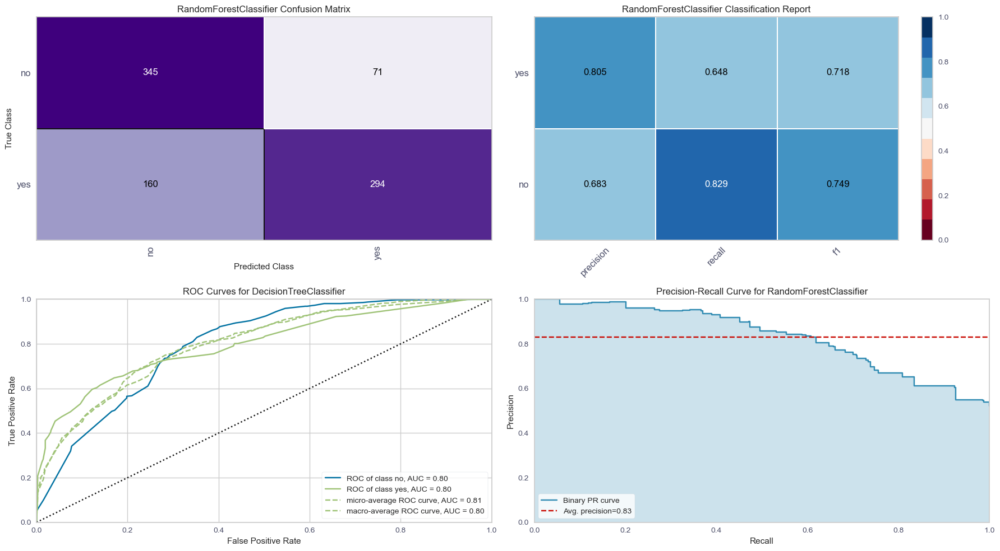

In [187]:
fig, axs = plt.subplots(nrows=2, ncols=2, figsize=(18,10))

visual_grid_dt = [
  ConfusionMatrix(best_model_rf, classes=['no', 'yes'], cmap='Purples', ax=axs[0,0]),
  ClassificationReport(best_model_rf, classes=['no', 'yes'], support=False, cmap='RdBu', ax=axs[0,1]),
  ROCAUC(best_model_dt, classes=['no', 'yes'], ax=axs[1,0]),
  PrecisionRecallCurve(best_model_rf, ax=axs[1,1])
]

for v in visual_grid_dt:
  v.fit(X_train, y_train)
  v.score(X_val, y_val)
  v.finalize()

plt.tight_layout()

In [188]:
from sklearn.neural_network import MLPClassifier

nn = MLPClassifier(hidden_layer_sizes=13, activation='relu', solver='adam', learning_rate='adaptive', learning_rate_init=0.0001, max_iter=10000, verbose=True)

nn.fit(X_train, y_train)

Iteration 1, loss = 0.95238607
Iteration 2, loss = 0.92104180
Iteration 3, loss = 0.89263205
Iteration 4, loss = 0.86665295
Iteration 5, loss = 0.84276578
Iteration 6, loss = 0.82132600
Iteration 7, loss = 0.80235881
Iteration 8, loss = 0.78511997
Iteration 9, loss = 0.76923885
Iteration 10, loss = 0.75504825
Iteration 11, loss = 0.74226157
Iteration 12, loss = 0.73095934
Iteration 13, loss = 0.72099286
Iteration 14, loss = 0.71196147
Iteration 15, loss = 0.70396856
Iteration 16, loss = 0.69665128
Iteration 17, loss = 0.69020149
Iteration 18, loss = 0.68437998
Iteration 19, loss = 0.67908014
Iteration 20, loss = 0.67439816
Iteration 21, loss = 0.66999150
Iteration 22, loss = 0.66594088
Iteration 23, loss = 0.66213353
Iteration 24, loss = 0.65862955
Iteration 25, loss = 0.65530609
Iteration 26, loss = 0.65221626
Iteration 27, loss = 0.64921890
Iteration 28, loss = 0.64636010
Iteration 29, loss = 0.64364886
Iteration 30, loss = 0.64096923
Iteration 31, loss = 0.63835408
Iteration 32, los

MLPClassifier(hidden_layer_sizes=13, learning_rate='adaptive',
              learning_rate_init=0.0001, max_iter=10000, verbose=True)

In [189]:
y_pred_nn = nn.predict(X_val)
print(f'ROC-AUC in X_val for NN:\t {np.round(roc_auc_score(y_val, y_pred_nn),2)}')

ROC-AUC in X_val for NN:	 0.72


In [191]:
params_nn = {
  'hidden_layer_sizes':[9, 10, 11],
  'solver':['adam', 'sgd'],
  'alpha':[0.001, 0.0001, 0.00001],
  'learning_rate':['constant', 'invscaling', 'adaptive'],
  'activation': ['relu', 'tanh', 'logistic']
}

grid_search_nn = GridSearchCV(
  nn,
  scoring='roc_auc',
  param_grid=params_nn,
  cv=5,
  return_train_score=True,
  n_jobs=-1,
  verbose=1
)

grid_search_nn.fit(X_train, y_train)

Fitting 5 folds for each of 162 candidates, totalling 810 fits
Iteration 1, loss = 0.89118641
Iteration 1, loss = 0.70488333
Iteration 2, loss = 0.70169439
Iteration 2, loss = 0.87617300
Iteration 3, loss = 0.69851139
Iteration 3, loss = 0.86217167
Iteration 4, loss = 0.69540178
Iteration 4, loss = 0.84873678
Iteration 5, loss = 0.83509621
Iteration 5, loss = 0.69227762
Iteration 6, loss = 0.82209465
Iteration 6, loss = 0.68910919
Iteration 1, loss = 0.74166884
Iteration 7, loss = 0.81057338
Iteration 7, loss = 0.68587571
Iteration 2, loss = 0.74006035
Iteration 8, loss = 0.79992127
Iteration 3, loss = 0.73844423
Iteration 8, loss = 0.68261946
Iteration 1, loss = 0.71064428
Iteration 9, loss = 0.79012155
Iteration 4, loss = 0.73692808
Iteration 9, loss = 0.67949144
Iteration 2, loss = 0.70560624
Iteration 5, loss = 0.73547420
Iteration 10, loss = 0.67623719
Iteration 3, loss = 0.70084026
Iteration 6, loss = 0.73409985
Iteration 10, loss = 0.78089158
Iteration 7, loss = 0.73280336
Itera

GridSearchCV(cv=5,
             estimator=MLPClassifier(hidden_layer_sizes=13,
                                     learning_rate='adaptive',
                                     learning_rate_init=0.0001, max_iter=10000,
                                     verbose=True),
             n_jobs=-1,
             param_grid={'activation': ['relu', 'tanh', 'logistic'],
                         'alpha': [0.001, 0.0001, 1e-05],
                         'hidden_layer_sizes': [9, 10, 11],
                         'learning_rate': ['constant', 'invscaling',
                                           'adaptive'],
                         'solver': ['adam', 'sgd']},
             return_train_score=True, scoring='roc_auc', verbose=1)

In [192]:
df_best_params_nn = pd.DataFrame(grid_search_nn.cv_results_)

table_results_nn = fun_plot_grid_results(df_best_params_nn)

table_results_nn

,activation,alpha,hidden_layer_sizes,learning_rate,solver,mean_train_score,mean_test_score,rank_test_score
0,relu,0.001000,9,constant,adam,0.780450,0.780078,1
18,relu,0.000100,9,constant,adam,0.780401,0.779812,2
94,tanh,0.000010,9,adaptive,adam,0.779653,0.779115,3
106,tanh,0.000010,11,adaptive,adam,0.780304,0.779095,4
20,relu,0.000100,9,invscaling,adam,0.779798,0.778806,5
14,relu,0.001000,11,invscaling,adam,0.780730,0.778633,6
56,tanh,0.001000,9,invscaling,adam,0.778399,0.778363,7
44,relu,0.000010,10,invscaling,adam,0.779759,0.778209,8
78,tanh,0.000100,10,constant,adam,0.778218,0.778199,9
104,tanh,0.000010,11,invscaling,adam,0.778604,0.778115,10


In [193]:
best_model_nn = grid_search_nn.best_estimator_
best_model_nn

MLPClassifier(alpha=0.001, hidden_layer_sizes=9, learning_rate_init=0.0001,
              max_iter=10000, verbose=True)

In [194]:
y_pred_nn_best = best_model_nn.predict(X_val)
print(f'ROC-AUC in best_model_nn:\t {np.round(roc_auc_score(y_val,y_pred_nn_best),2)}')

ROC-AUC in best_model_nn:	 0.72


/Users/alejandrodelgado/kaggle/kaggle_env/lib/python3.10/site-packages/sklearn/base.py:420: UserWarning:

X does not have valid feature names, but MLPClassifier was fitted with feature names

/Users/alejandrodelgado/kaggle/kaggle_env/lib/python3.10/site-packages/sklearn/base.py:420: UserWarning:

X does not have valid feature names, but MLPClassifier was fitted with feature names

/Users/alejandrodelgado/kaggle/kaggle_env/lib/python3.10/site-packages/sklearn/base.py:420: UserWarning:

X does not have valid feature names, but DecisionTreeClassifier was fitted with feature names

/Users/alejandrodelgado/kaggle/kaggle_env/lib/python3.10/site-packages/sklearn/base.py:420: UserWarning:

X does not have valid feature names, but MLPClassifier was fitted with feature names



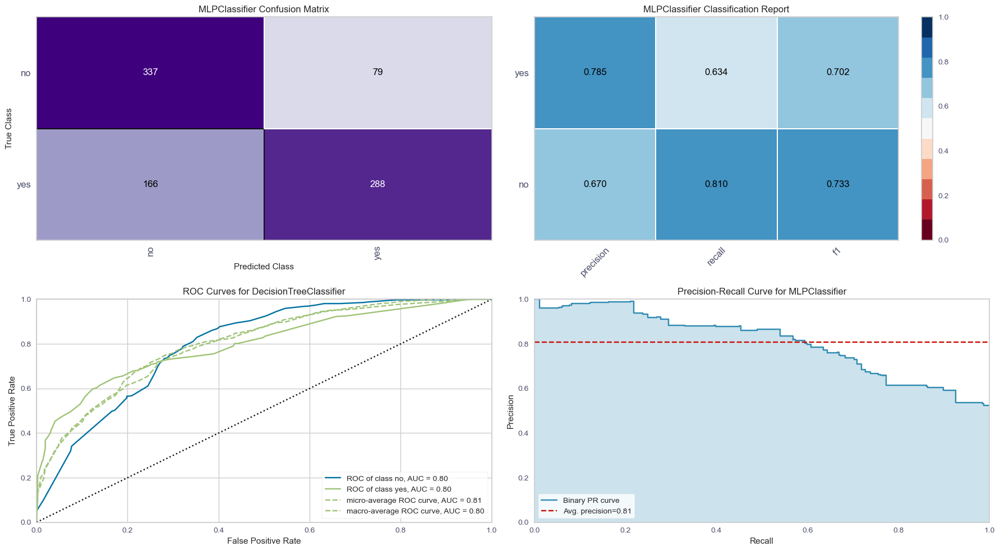

In [195]:
fig, axs = plt.subplots(nrows=2, ncols=2, figsize=(18,10))

visual_grid_dt = [
  ConfusionMatrix(best_model_nn, classes=['no', 'yes'], cmap='Purples', ax=axs[0,0]),
  ClassificationReport(best_model_nn, classes=['no', 'yes'], support=False, cmap='RdBu', ax=axs[0,1]),
  ROCAUC(best_model_dt, classes=['no', 'yes'], ax=axs[1,0]),
  PrecisionRecallCurve(best_model_nn, ax=axs[1,1])
]

for v in visual_grid_dt:
  v.fit(X_train, y_train)
  v.score(X_val, y_val)
  v.finalize()

plt.tight_layout()

In [197]:
y_pred_rf_best_nn = best_model_nn.predict(X_val)
print(f'ROC-AUC best_model_rf:\t {np.round(roc_auc_score(y_val, y_pred_rf_best_nn),2)}')

ROC-AUC best_model_rf:	 0.72


In [198]:
print(classification_report(y_val, y_pred_nn_best))

              precision    recall  f1-score   support

           0       0.67      0.81      0.73       416
           1       0.78      0.63      0.70       454

    accuracy                           0.72       870
   macro avg       0.73      0.72      0.72       870
weighted avg       0.73      0.72      0.72       870



In [200]:
y_pred_rf_best = best_model_rf.predict(X_val)
print(classification_report(y_val, y_pred_rf_best))

              precision    recall  f1-score   support

           0       0.68      0.83      0.75       416
           1       0.81      0.65      0.72       454

    accuracy                           0.73       870
   macro avg       0.74      0.74      0.73       870
weighted avg       0.75      0.73      0.73       870



In [202]:
y_pred_dt_best = best_model_dt.predict(X_val)
print(f'ROC-AUC best_model_dt:\t {np.round(roc_auc_score(y_val, y_pred_dt_best),2)}')

ROC-AUC best_model_dt:	 0.74


In [203]:
print(classification_report(y_val, y_pred_dt_best))

              precision    recall  f1-score   support

           0       0.67      0.86      0.75       416
           1       0.83      0.61      0.71       454

    accuracy                           0.73       870
   macro avg       0.75      0.74      0.73       870
weighted avg       0.75      0.73      0.73       870



/Users/alejandrodelgado/kaggle/kaggle_env/lib/python3.10/site-packages/sklearn/base.py:420: UserWarning:

X does not have valid feature names, but RandomForestClassifier was fitted with feature names



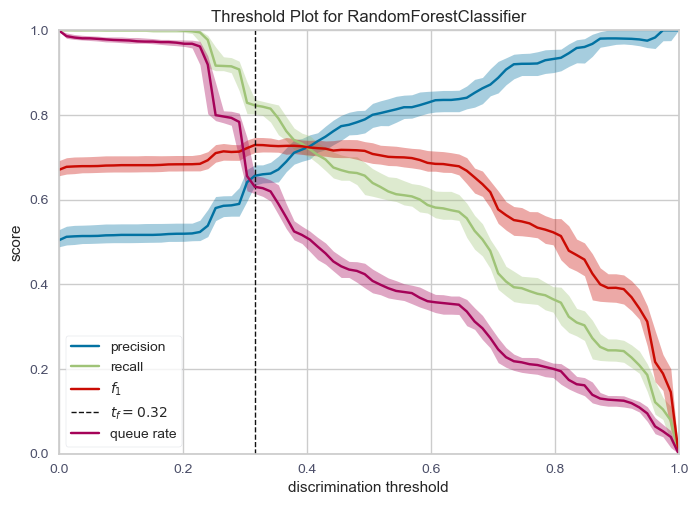

<AxesSubplot: title={'center': 'Threshold Plot for RandomForestClassifier'}, xlabel='discrimination threshold', ylabel='score'>

In [204]:
vis_threshold = DiscriminationThreshold(
  best_model_rf
)

vis_threshold.fit(X_train, y_train)
vis_threshold.show()

/Users/alejandrodelgado/kaggle/kaggle_env/lib/python3.10/site-packages/sklearn/base.py:420: UserWarning:

X does not have valid feature names, but DecisionTreeClassifier was fitted with feature names



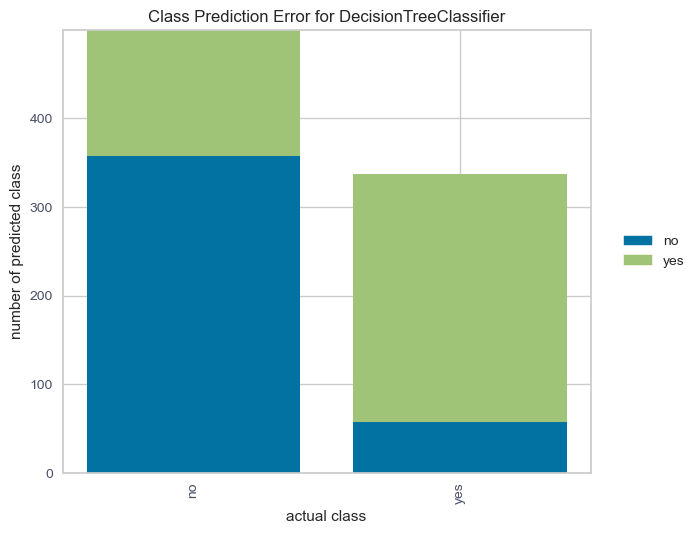

<AxesSubplot: title={'center': 'Class Prediction Error for DecisionTreeClassifier'}, xlabel='actual class', ylabel='number of predicted class'>

In [205]:
from yellowbrick.classifier import ClassPredictionError

vis_classpred = ClassPredictionError(
  best_model_dt,
  classes=['no', 'yes']
)

vis_classpred.fit(X_train, y_train)
vis_classpred.score(X_val, y_val)
vis_classpred.show()

In [209]:
def fun_pred_threshold(model, X_test, threshold):
  threshold=threshold
  return np.round(np.where(model.predict_proba(X_test)[:,1] < threshold, 0, 1), 2)
  

def fun_predict(model, X_test):
  return model.predict(X_test)

y_pred_thr = fun_pred_threshold(best_model_rf, X_val, 0.36)
y_pred_check = fun_predict(best_model_rf, X_val)

In [210]:
print(y_pred_thr[0:20])
print(y_pred_check[0:20])

[1 0 1 0 0 1 1 1 1 1 1 0 1 1 1 1 1 1 0 1]
[1 0 1 0 0 1 1 0 1 1 1 0 1 0 1 0 1 1 0 1]


In [211]:
print(classification_report(y_val, y_pred_thr))

              precision    recall  f1-score   support

           0       0.70      0.62      0.65       416
           1       0.68      0.76      0.72       454

    accuracy                           0.69       870
   macro avg       0.69      0.69      0.69       870
weighted avg       0.69      0.69      0.69       870



In [212]:
print(classification_report(y_val, y_pred_check))

              precision    recall  f1-score   support

           0       0.68      0.83      0.75       416
           1       0.81      0.65      0.72       454

    accuracy                           0.73       870
   macro avg       0.74      0.74      0.73       870
weighted avg       0.75      0.73      0.73       870



In [214]:
X_test = test.drop(['PassengerId', 'CabinNum', 'VIP', 'FoodCourt', 'ShoppingMall'], axis=1)

preds_test = best_model_dt.predict(X_test)

In [215]:
submit = pd.DataFrame({
  'PassengerId':test['PassengerId'],
  'Transported':preds_test
})

submit

,PassengerId,Transported
0,0013_01,1
1,0018_01,0
2,0019_01,1
3,0021_01,0
4,0023_01,0
...,...,...
4272,9266_02,1
4273,9269_01,0
4274,9271_01,1
4275,9273_01,0
